# Imports

In [1]:
! pip install chex

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 101.0/101.0 kB 9.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 135.8/135.8 kB 16.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.1/58.1 kB 7.4 MB/s eta 0:00:00
  Attempting uninstall: toolz
    Found existing installation: toolz 0.12.1
    Uninstalling toolz-0.12.1:
      Successfully uninstalled toolz-0.12.1
  Attempting uninstall: absl-py
    Found existing installation: absl-py 1.4.0
    Uninstalling absl-py-1.4.0:
      Successfully uninstalled absl-py-1.4.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
ibis-framework 9.5.0 requires toolz<1,>=0.11, but you have toolz 1.1.0 which is incompatible.


In [2]:
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import numpy as np
import chex
import typing as t
from functools import partial
import matplotlib.pyplot as plt


# VizUtils

In [3]:
import os
os.environ['FFMPEG_BINARY'] = 'ffmpeg'
import moviepy.editor as mvp
from moviepy.video.io.ffmpeg_writer import FFMPEG_VideoWriter
from IPython.display import HTML, display, clear_output

class VideoWriter:
  def __init__(self, filename, fps=30.0, **kw):
    self.writer = None
    self.params = dict(filename=filename, fps=fps, **kw)

  def add(self, img):
    img = np.asarray(img)
    if self.writer is None:
      h, w = img.shape[:2]
      self.writer = FFMPEG_VideoWriter(size=(w, h), **self.params)
    if img.dtype in [np.float32, np.float64]:
      img = np.uint8(img.clip(0, 1)*255)
    if len(img.shape) == 2:
      img = np.repeat(img[..., None], 3, -1)
    self.writer.write_frame(img)

  def close(self):
    if self.writer:
      self.writer.close()

  def __enter__(self):
    return self

  def __exit__(self, *kw):
    self.close()

  def show(self, **kw):
      self.close()
      fn = self.params['filename']
      display(mvp.ipython_display(fn, **kw))


/usr/local/lib/python3.12/dist-packages/moviepy/config_defaults.py:47: SyntaxWarning: invalid escape sequence '\P'
  IMAGEMAGICK_BINARY = r"C:\Program Files\ImageMagick-6.8.8-Q16\magick.exe"
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:294: SyntaxWarning: invalid escape sequence '\d'
  lines_video = [l for l in lines if ' Video: ' in l and re.search('\d+x\d+', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:367: SyntaxWarning: invalid escape sequence '\d'
  rotation_lines = [l for l in lines if 'rotate          :' in l and re.search('\d+$', l)]
/usr/local/lib/python3.12/dist-packages/moviepy/video/io/ffmpeg_reader.py:370: SyntaxWarning: invalid escape sequence '\d'
  match = re.search('\d+$', rotation_line)
  if event.key is 'enter':



# Utils

In [4]:
def sigmoid(x):
    return 0.5 * (jnp.tanh(x / 2) + 1)

ker_f = lambda x, a, w, b : (b * jnp.exp( - (x[..., None] - a)**2 / w)).sum(-1)

bell = lambda x, m, s: jnp.exp(-((x-m)/s)**2 / 2)

def growth(U, m, s):
    return bell(U, m, s)*2-1

kx = jnp.array([
                [1., 0., -1.],
                [2., 0., -2.],
                [1., 0., -1.]
])
ky = jnp.transpose(kx)
def sobel_x(A):
    """
    A : (x, y, c)
    ret : (x, y, c)
    """
    return jnp.dstack([jsp.signal.convolve2d(A[:, :, c], kx, mode = 'same')
                    for c in range(A.shape[-1])])
def sobel_y(A):
    return jnp.dstack([jsp.signal.convolve2d(A[:, :, c], ky, mode = 'same')
                    for c in range(A.shape[-1])])

@jax.jit
def sobel(A):
    return jnp.concatenate((sobel_y(A)[:, :, None, :], sobel_x(A)[:, :, None, :]),
                            axis = 2)



def get_kernels(SX: int, SY: int, nb_k: int, params):
    mid = SX//2
    Ds = [ np.linalg.norm(np.mgrid[-mid:mid, -mid:mid], axis=0) /
          ((params['R']+15) * params['r'][k]) for k in range(nb_k) ]  # (x,y,k)
    K = jnp.dstack([sigmoid(-(D-1)*10) * ker_f(D, params["a"][k], params["w"][k], params["b"][k])
                    for k, D in zip(range(nb_k), Ds)])
    nK = K / jnp.sum(K, axis=(0,1), keepdims=True)
    return nK


def conn_from_matrix(mat):
    C = mat.shape[0]
    c0 = []
    c1 = [[] for _ in range(C)]
    i = 0
    for s in range(C):
        for t in range(C):
            n = mat[s, t]
            if n:
                c0 = c0 + [s]*n
                c1[t] = c1[t] + list(range(i, i+n))
            i+=n
    return c0, c1


def conn_from_lists(c0, c1, C):
    return c0, [[i == c1[i] for i in range(len(c0))] for c in range(C)]


# Reintegration Tracking

In [5]:

class ReintegrationTracking:

    def __init__(self, SX=256, SY=256, dt=.2, dd=5, sigma=.65, border="wall", has_hidden=False,
                 hidden_dims=None, mix="softmax"):
        self.SX = SX
        self.SY = SY
        self.dt = dt
        self.dd = dd
        self.sigma = sigma
        self.has_hidden = has_hidden
        self.hidden_dims = hidden_dims
        self.border = border if border in ['wall', 'torus'] else 'wall'
        self.mix = mix

        self.apply = self._build_apply()

    def __call__(self, *args):
        return self.apply(*args)

    def _build_apply(self):

        x, y = jnp.arange(self.SX), jnp.arange(self.SY)
        X, Y = jnp.meshgrid(x, y)
        pos = jnp.dstack((Y, X)) + .5 #(SX, SY, 2)
        dxs = []
        dys = []
        dd = self.dd
        for dx in range(-dd, dd+1):
            for dy in range(-dd, dd+1):
                dxs.append(dx)
                dys.append(dy)
        dxs = jnp.array(dxs)
        dys = jnp.array(dys)
        #-----------------------------------------------------------------------------------------------
        if not self.has_hidden:

            @partial(jax.vmap, in_axes=(None, None, 0, 0))
            def step(X, mu, dx, dy):
                Xr = jnp.roll(X, (dx, dy), axis = (0, 1))
                mur = jnp.roll(mu, (dx, dy), axis = (0, 1))
                if self.border == 'torus':
                    dpmu = jnp.min(jnp.stack(
                        [jnp.absolute(pos[..., None] - (mur + jnp.array([di, dj])[None, None, :, None]))
                        for di in (-self.SX, 0, self.SX) for dj in (-self.SY, 0, self.SY)]
                    ), axis = 0)
                else :
                    dpmu = jnp.absolute(pos[..., None] - mur)
                sz = .5 - dpmu + self.sigma
                area = jnp.prod(jnp.clip(sz, 0, min(1, 2*self.sigma)) , axis = 2) / (4 * self.sigma**2)
                nX = Xr * area
                return nX

            def apply(X, F):

                ma = self.dd - self.sigma  # upper bound of the flow magnitude
                mu = pos[..., None] + jnp.clip(self.dt * F, -ma, ma) #(x, y, 2, c) : target positions (distribution centers)
                if self.border == "wall":
                    mu = jnp.clip(mu, self.sigma, self.SX-self.sigma)
                nX = step(X, mu, dxs, dys).sum(axis = 0)

                return nX
        #-----------------------------------------------------------------------------------------------
        else :



            @partial(jax.vmap, in_axes = (None, None, None, 0, 0))
            def step_flow(X, H, mu, dx, dy):
                """Summary
                """
                Xr = jnp.roll(X, (dx, dy), axis = (0, 1))
                Hr = jnp.roll(H, (dx, dy), axis = (0, 1)) #(x, y, k)
                mur = jnp.roll(mu, (dx, dy), axis = (0, 1))

                if self.border == 'torus':
                    dpmu = jnp.min(jnp.stack(
                        [jnp.absolute(pos[..., None] - (mur + jnp.array([di, dj])[None, None, :, None]))
                        for di in (-self.SX, 0, self.SX) for dj in (-self.SY, 0, self.SY)]
                    ), axis = 0)
                else :
                    dpmu = jnp.absolute(pos[..., None] - mur)

                sz = .5 - dpmu + self.sigma
                area = jnp.prod(jnp.clip(sz, 0, min(1, 2*self.sigma)) , axis = 2) / (4 * self.sigma**2)
                nX = Xr * area
                return nX, Hr

            def apply(X, H, F):

                ma = self.dd - self.sigma  # upper bound of the flow magnitude
                mu = pos[..., None] + jnp.clip(self.dt * F, -ma, ma) #(x, y, 2, c) : target positions (distribution centers)
                if self.border == "wall":
                    mu = jnp.clip(mu, self.sigma, self.SX-self.sigma)
                nX, nH = step_flow(X, H, mu, dxs, dys)

                if self.mix == 'avg':
                    nH = jnp.sum(nH * nX.sum(axis = -1, keepdims = True), axis = 0)
                    nX = jnp.sum(nH, axis = 0)
                    nH = nH / (nX.sum(axis = -1, keepdims = True)+1e-10)

                elif self.mix == "softmax":
                    expnX = jnp.exp(nX.sum(axis = -1, keepdims = True)) - 1
                    nX = jnp.sum(nX, axis = 0)
                    nH = jnp.sum(nH * expnX, axis = 0) / (expnX.sum(axis = 0)+1e-10) #avg rule

                elif self.mix == "stoch":
                    categorical=jax.random.categorical(
                      jax.random.PRNGKey(42),
                      jnp.log(nX.sum(axis = -1, keepdims = True)),
                      axis=0)
                    mask=jax.nn.one_hot(categorical,num_classes=(2*self.dd+1)**2,axis=-1)
                    mask=jnp.transpose(mask,(3,0,1,2))
                    nH = jnp.sum(nH * mask, axis = 0)
                    nX = jnp.sum(nX, axis = 0)

                elif self.mix == "stoch_gene_wise":
                    mask = jnp.concatenate(
                      [jax.nn.one_hot(jax.random.categorical(
                                                            jax.random.PRNGKey(42),
                                                            jnp.log(nX.sum(axis = -1, keepdims = True)),
                                                            axis=0),
                                      num_classes=(2*dd+1)**2,axis=-1)
                      for _ in range(self.hidden_dims)],
                      axis = 2)
                    mask=jnp.transpose(mask,(3,0,1,2)) # (2dd+1**2, x, y, nb_k)
                    nH = jnp.sum(nH * mask, axis = 0)
                    nX = jnp.sum(nX, axis = 0)

                return nX, nH

        return apply



# Flow Lenia

In [6]:
@chex.dataclass
class Params:
    """Flow Lenia update rule parameters
    """
    r: jnp.ndarray
    b: jnp.ndarray
    w: jnp.ndarray
    a: jnp.ndarray
    m: jnp.ndarray
    s: jnp.ndarray
    h: jnp.ndarray
    R: float


@chex.dataclass
class CompiledParams:
    """Flow Lenia compiled parameters
    """
    fK: jnp.ndarray
    m: jnp.ndarray
    s: jnp.ndarray
    h: jnp.ndarray



class RuleSpace :

    """Rule space for Flow Lenia system

    Attributes:
        kernel_keys (TYPE): Description
        nb_k (int): number of kernels of the system
        spaces (TYPE): Description
    """

    #-----------------------------------------------------------------------------
    def __init__(self, nb_k: int):
        """
        Args:
            nb_k (int): number of kernels in the update rule
        """
        self.nb_k = nb_k
        self.kernel_keys = 'r b w a m s h'.split()
        self.spaces = {
            "r" : {'low' : .2, 'high' : 1., 'mut_std' : .2, 'shape' : None},
            "b" : {'low' : .001, 'high' : 1., 'mut_std' : .2, 'shape' : (3,)},
            "w" : {'low' : .01, 'high' : .5, 'mut_std' : .2, 'shape' : (3,)},
            "a" : {'low' : .0, 'high' : 1., 'mut_std' : .2, 'shape' : (3,)},
            "m" : {'low' : .05, 'high' : .5, 'mut_std' : .2, 'shape' : None},
            "s" : {'low' : .001, 'high' : .18, 'mut_std' : .01, 'shape' : None},
            "h" : {'low' : .01, 'high' : 1., 'mut_std' : .2, 'shape' : None},
            'R' : {'low' : 2., 'high' : 25., 'mut_std' : .2, 'shape' : None},
        }
    #-----------------------------------------------------------------------------
    def sample(self, key: jnp.ndarray)->Params:
        """sample a random set of parameters

        Returns:
            Params: sampled parameters

        Args:
            key (jnp.ndarray): random generation key
        """
        kernels = {}
        for k in 'rmsh':
            key, subkey = jax.random.split(key)
            kernels[k] = jax.random.uniform(
              key=subkey, minval=self.spaces[k]['low'], maxval=self.spaces[k]['high'],
              shape=(self.nb_k,)
            )
        for k in "awb":
            key, subkey = jax.random.split(key)
            kernels[k] = jax.random.uniform(
              key=subkey, minval=self.spaces[k]['low'], maxval=self.spaces[k]['high'],
              shape=(self.nb_k, 3)
            )
        R = jax.random.uniform(key=key, minval=self.spaces['R']['low'], maxval=self.spaces['R']['high'])
        return Params(R=R, **kernels)

class KernelComputer:

    """Summary

    Attributes:
        apply (Callable): main function transforming raw params (Params) in compiled ones (CompiledParams)
        SX (int): X size
        SY (int): Y size
    """

    def __init__(self, SX: int, SY: int, nb_k: int):
        """Summary

        Args:
            SX (int): Description
            SY (int): Description
            nb_k (int): Description
        """
        self.SX = SX
        self.SY = SY

        mid = SX // 2
        def compute_kernels(params: Params)->CompiledParams:
            """Compute kernels and return a dic containing kernels fft

            Args:
                params (Params): raw params of the system

            Returns:
                CompiledParams: compiled params which can be used as update rule
            """

            Ds = [ np.linalg.norm(np.mgrid[-mid:mid, -mid:mid], axis=0) /
                  ((params.R+15) * params.r[k]) for k in range(nb_k) ]  # (x,y,k)
            K = jnp.dstack([sigmoid(-(D-1)*10) * ker_f(D, params.a[k], params.w[k], params.b[k])
                            for k, D in zip(range(nb_k), Ds)])
            nK = K / jnp.sum(K, axis=(0,1), keepdims=True)  # Normalize kernels
            fK = jnp.fft.fft2(jnp.fft.fftshift(nK, axes=(0,1)), axes=(0,1))  # Get kernels fft

            return CompiledParams(fK=fK, m=params.m, s=params.s, h=params.h)

        self.apply = jax.jit(compute_kernels)

    def __call__(self, params: Params):
        """callback to apply
        """
        return self.apply(params)


#==================================================================================================================
#==================================================FLOW LENIA======================================================
#==================================================================================================================

@chex.dataclass
class Config :

    """Configuration of Flow Lenia system
    """
    SX: int
    SY: int
    nb_k: int
    C: int
    c0: t.Iterable
    c1: t.Iterable
    dt: float
    dd: int = 5
    sigma: float = .65
    n: int = 2
    theta_A : float = 1.
    border: str = 'wall'

@chex.dataclass
class State :

    """State of the system
    """
    A: jnp.ndarray

class FlowLenia :

    """class building the main functions of Flow Lenia

    Attributes:
        config (FL_Config): config of the system
        kernel_computer (KernelComputer): kernel computer
        rollout_fn (Callable): rollout function
        RT (ReintegrationTracking): Description
        rule_space (RuleSpace): Rule space of the system
        step_fn (Callable): system step function
    """

    #------------------------------------------------------------------------------

    def __init__(self, config: Config):
        """
        Args:
            config (Config): config of the system
        """
        self.config = config

        self.rule_space = RuleSpace(config.nb_k)

        self.kernel_computer = KernelComputer(self.config.SX, self.config.SY, self.config.nb_k)

        self.RT = ReintegrationTracking(self.config.SX, self.config.SY, self.config.dt,
            self.config.dd, self.config.sigma, self.config.border)

        self.step_fn = self._build_step_fn()

        self.rollout_fn = self._build_rollout()

    #------------------------------------------------------------------------------

    def __call__(self, state: State, params: CompiledParams)->State:
        """callback to step function

        Args:
            state (State): Description
            params (CompiledParams): Description

        Returns:
            State: Description
        """
        return self.step_fn(state, params)

    #------------------------------------------------------------------------------

    def _build_step_fn(self)->t.Callable[[State, CompiledParams], State]:
        """Build step function of the system according to config

        Returns:
            t.Callable[[State, CompiledParams], State]: step function which outputs next state
            given a state and params
        """

        def step(state: State, params: CompiledParams)->State:
            """
            Main step

            Args:
                state (State): state of the system
                params (CompiledParams): params

            Returns:
                State: new state of the system

            """
            #---------------------------Original Lenia------------------------------------
            A = state.A

            fA = jnp.fft.fft2(A, axes=(0,1))  # (x,y,c)

            fAk = fA[:, :, self.config.c0]  # (x,y,k)

            U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))  # (x,y,k)

            U = growth(U, params.m, params.s) * params.h  # (x,y,k)

            U = jnp.dstack([ U[:, :, self.config.c1[c]].sum(axis=-1) for c in range(self.config.C) ])  # (x,y,c)

            #-------------------------------FLOW------------------------------------------

            nabla_U = sobel(U) #(x, y, 2, c)

            nabla_A = sobel(A.sum(axis = -1, keepdims = True)) #(x, y, 2, 1)

            alpha = jnp.clip((A[:, :, None, :]/self.config.theta_A)**self.config.n, .0, 1.)

            F = nabla_U * (1 - alpha) - nabla_A * alpha

            nA = self.RT.apply(A, F)

            return State(A=nA)

        return step

    #------------------------------------------------------------------------------

    def _build_rollout(self)->t.Callable[[CompiledParams, State, int], t.Tuple[State, State]]:
        """build rollout function

        Returns:
            t.Callable[[CompiledParams, State, int], t.Tuple[State, State]]: Description
        """
        def scan_step(carry: t.Tuple[State, CompiledParams], x)->t.Tuple[t.Tuple[State, CompiledParams], State]:
            """Summary

            Args:
                carry (t.Tuple[State, CompiledParams]): Description
                x (TYPE): Description

            Returns:
                t.Tuple[t.Tuple[State, CompiledParams], State]: Description
            """
            state, params = carry
            nstate = jax.jit(self.step_fn)(state, params)
            return (nstate, params), nstate

        def rollout(params: CompiledParams, init_state: State, steps: int) -> t.Tuple[State, State]:
            """Summary

            Args:
                params (CompiledParams): Description
                init_state (State): Description
                steps (int): Description

            Returns:
                t.Tuple[State, State]: Description
            """
            return jax.lax.scan(scan_step, (init_state, params), None, length = steps)

        return rollout


# Flow Lenia + Parameter Embedding

In [7]:
@chex.dataclass
class Config_P(Config):

    """Summary
    """
    mix: str = 'stoch'

@chex.dataclass
class State_P(State):

    """state of system
    """
    P: jnp.ndarray

class FlowLeniaParams:

    """Flow Lenia system with parameters embedding

    Attributes:
        config (TYPE): config of the system
        kernel_computer (TYPE): -
        rollout_fn (TYPE): -
        rule_space (TYPE): -
        step_fn (TYPE): -
    """

    #------------------------------------------------------------------------------

    def __init__(self, config: Config):
        """_

        Args:
            config (Config): config of the system
        """

        self.config = config

        self.rule_space = RuleSpace(config.nb_k)

        self.kernel_computer = KernelComputer(config.SX, config.SY, config.nb_k)

        self.RT = ReintegrationTracking(self.config.SX, self.config.SY, self.config.dt,
            self.config.dd, self.config.sigma, self.config.border, has_hidden=True,
            hidden_dims=self.config.nb_k, mix=self.config.mix)

        self.step_fn = self._build_step_fn()

        self.rollout_fn = self._build_rollout()

    #------------------------------------------------------------------------------

    def _build_step_fn(self)->t.Callable[[State, CompiledParams], State]:
        """build step function

        Returns:
            t.Callable[[State, CompiledParams], State]: step function
        """


        SX, SY, dd, sigma, dt = (self.config.SX, self.config.SY, self.config.dd,
                             self.config.sigma, self.config.dt)


        def step(state: State, params: CompiledParams)->State:
            """
            Main step


            Args:
                state (State): state of the system where A are activations and P is the parameter map
                params (CompiledParams): compiled params of update rule

            Returns:
                State: new state of the systems
            """
            A, P = state.A, state.P
            #---------------------------Original Lenia------------------------------------
            fA = jnp.fft.fft2(A, axes=(0,1))  # (x,y,c)

            fAk = fA[:, :, self.config.c0]  # (x,y,k)

            U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))  # (x,y,k)

            U = growth(U, params.m, params.s) * P # (x,y,k)

            U = jnp.dstack([ U[:, :, self.config.c1[c]].sum(axis=-1) for c in range(self.config.C) ])  # (x,y,c)

            #-------------------------------FLOW------------------------------------------

            F = sobel(U) #(x, y, 2, c) : Flow

            C_grad = sobel(A.sum(axis = -1, keepdims = True)) #(x, y, 2, 1) : concentration gradient

            alpha = jnp.clip((A[:, :, None, :]/2)**2, .0, 1.)

            F = jnp.clip(F * (1 - alpha) - C_grad * alpha, - (dd-sigma), dd - sigma)

            nA, nP = self.RT.apply(A, P, F)

            return State_P(A=nA, P=nP)

        return step

    #------------------------------------------------------------------------------

    def _build_rollout(self):
        """build a rollout function taking as input params, an initial state and a number of steps
        and returning the final state of the system and the stacked states

        Returns:
            Callable
        """
        def scan_step(carry: t.Tuple[State, CompiledParams], x)->t.Tuple[t.Tuple[State, CompiledParams], State]:
            """Summary

            Args:
                carry (t.Tuple[State, CompiledParams]): state of the system [state x params]
                x: None

            Returns:
                t.Tuple[t.Tuple[State, CompiledParams], State]: rollout function
            """
            state, params = carry
            nstate = jax.jit(self.step_fn)(state, params)
            return (nstate, params), nstate

        def rollout(params: CompiledParams, init_state: State, steps: int) -> t.Tuple[State, State]:
            """Summary

            Args:
                params (CompiledParams): compiled params of the systems
                init_state (State): initial state of the system
                steps (int): number of steps to simulate

            Returns:
                t.Tuple[State, State]: returns the final state and the stacked states of the rollout
            """
            return jax.lax.scan(scan_step, (init_state, params), None, length = steps)

        return rollout


# Lenia

In [8]:
class Lenia :

    """class building the main functions of Flow Lenia

    Attributes:
        config (FL_Config): config of the system
        kernel_computer (KernelComputer): kernel computer
        rollout_fn (Callable): rollout function
        RT (ReintegrationTracking): Description
        rule_space (RuleSpace): Rule space of the system
        step_fn (Callable): system step function
    """

    #------------------------------------------------------------------------------

    def __init__(self, config: Config):
        """
        Args:
            config (Config): config of the system
        """
        self.config = config

        self.rule_space = RuleSpace(config.nb_k)

        self.kernel_computer = KernelComputer(self.config.SX, self.config.SY, self.config.nb_k)

        self.RT = ReintegrationTracking(self.config.SX, self.config.SY, self.config.dt,
            self.config.dd, self.config.sigma, self.config.border)

        self.step_fn = self._build_step_fn()

        self.rollout_fn = self._build_rollout()

    #------------------------------------------------------------------------------

    def __call__(self, state: State, params: CompiledParams)->State:
        """callback to step function

        Args:
            state (State): Description
            params (CompiledParams): Description

        Returns:
            State: Description
        """
        return self.step_fn(state, params)

    #------------------------------------------------------------------------------

    def _build_step_fn(self)->t.Callable[[State, CompiledParams], State]:
        """Build step function of the system according to config

        Returns:
            t.Callable[[State, CompiledParams], State]: step function which outputs next state
            given a state and params
        """

        def step(state: State, params: CompiledParams)->State:
            """
            Main step

            Args:
                state (State): state of the system
                params (CompiledParams): params

            Returns:
                State: new state of the system

            """
            #---------------------------Original Lenia------------------------------------
            A = state.A

            fA = jnp.fft.fft2(A, axes=(0,1))  # (x,y,c)

            fAk = fA[:, :, self.config.c0]  # (x,y,k)

            U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))  # (x,y,k)

            U = growth(U, params.m, params.s) * params.h  # (x,y,k)

            U = jnp.dstack([ U[:, :, self.config.c1[c]].sum(axis=-1) for c in range(self.config.C) ])  # (x,y,c)

            #-------------------------------FLOW------------------------------------------

            nA = jnp.clip(A + self.config.dt * U, 0., 1.)

            return State(A=nA)

        return step

    #------------------------------------------------------------------------------

    def _build_rollout(self)->t.Callable[[CompiledParams, State, int], t.Tuple[State, State]]:
        """build rollout function

        Returns:
            t.Callable[[CompiledParams, State, int], t.Tuple[State, State]]: Description
        """
        def scan_step(carry: t.Tuple[State, CompiledParams], x)->t.Tuple[t.Tuple[State, CompiledParams], State]:
            """Summary

            Args:
                carry (t.Tuple[State, CompiledParams]): Description
                x (TYPE): Description

            Returns:
                t.Tuple[t.Tuple[State, CompiledParams], State]: Description
            """
            state, params = carry
            nstate = jax.jit(self.step_fn)(state, params)
            return (nstate, params), nstate

        def rollout(params: CompiledParams, init_state: State, steps: int) -> t.Tuple[State, State]:
            """Summary

            Args:
                params (CompiledParams): Description
                init_state (State): Description
                steps (int): Description

            Returns:
                t.Tuple[State, State]: Description
            """
            return jax.lax.scan(scan_step, (init_state, params), None, length = steps)

        return rollout


# Demo

## Lenia

> **Memory optimisation applied here:** Instead of accumulating all `T` frames in GPU memory via `jax.lax.scan`
> (which allocates a stacked array of shape `[T, SX, SY, C]`), we use a **streaming rollout** that runs
> the simulation in fixed-size *chunks* and writes each chunk directly to the video encoder.  
> Only one chunk (of `chunk_size` frames) lives in memory at a time — memory cost is **O(chunk_size)**
> instead of **O(T)**.  The `jax.block_until_ready` call forces the GPU computation to complete before
> we copy data to the CPU, which avoids hidden memory build-up from unevaluated futures.


In [ ]:
#@title Utils
def state2img(A):
    C = A.shape[-1]
    if C == 1:
        return A[..., 0]
    if C == 2:
        return np.dstack([A[..., 0], A[..., 0], A[..., 1]])
    return A[..., :3]


In [ ]:
#@title Configuration
number_of_kernels = 10 #@param {type:"raw"}
nb_k = number_of_kernels
world_size = 128 #@param {type : "integer"}
SX = SY = world_size
C = 1 # @param {type : "integer"}
dt = 0.2 # @param
theta_A = 2.0 # @param
sigma = 0.65 #@param
M = np.ones((C, C), dtype=int) * nb_k
nb_k = int(M.sum())
c0, c1 = conn_from_matrix( M )
config = Config(SX=SX, SY=SY, nb_k=nb_k, C=C, c0=c0, c1=c1,
                dt=dt, theta_A=theta_A, dd=5, sigma=sigma)
lenia = Lenia(config)

# ── OPTIMISATION: compile the single-step function once with jax.jit ─────────
# Previously the code called jax.jit(lenia.rollout_fn, static_argnums=(2,))
# which forced JAX to recompile for every distinct value of `steps`.
# Instead we JIT only the step function and manage the loop in Python so that
# we can yield frames without storing the full trajectory in memory.
step_fn = jax.jit(lenia.step_fn)


In [ ]:
#@title Initialize state and parameters

seed = 123 #@param {type : "integer"}
key = jax.random.PRNGKey(seed)
params_seed, state_seed = jax.random.split(key)
params = lenia.rule_space.sample(params_seed)
c_params = lenia.kernel_computer(params) # Process params

mx, my = SX//2, SY//2 # center coordinates
A0 = jnp.zeros((SX, SY, C)).at[mx-20:mx+20, my-20:my+20, :].set(
    jax.random.uniform(state_seed, (40, 40, C))
)
state = State(A=A0)


In [ ]:
#@title Simulate — streaming / low-memory rollout {vertical-output : true}
# ── MODIFICATION: streaming rollout replaces storing all T states ─────────────
# Original code:  (final_state, _), states = roll_fn(c_params, state, T)
#                 → allocates [T, SX, SY, C] array on the accelerator.
#
# New code: iterate step-by-step in Python, write each frame to the video
# encoder immediately, then discard it.  Peak memory is now a single frame
# (SX × SY × C floats) instead of T frames.
# ─────────────────────────────────────────────────────────────────────────────

T = 500 #@param {type : 'integer'}

current_state = state
with VideoWriter("lenia_example.mp4", 60) as vid:
    for i in range(T):
        current_state = step_fn(current_state, c_params)
        # jax.block_until_ready ensures the device computation is finished
        # before we pull the array to the CPU for encoding — this prevents
        # JAX from queuing T un-evaluated ops and silently holding memory.
        frame = np.array(jax.block_until_ready(current_state.A))
        vid.add(state2img(frame))

final_state_lenia = current_state
vid.show(width=360, height=360)


In [ ]:
#@title Timing + Data Collection (Lenia Optimized)

import time
import pandas as pd

T = 500  # keep same as above

def run_lenia_optimized():
    current_state = state
    for _ in range(T):
        current_state = step_fn(current_state, c_params)
    return current_state

# ⏱️ measure time
start = time.time()

final_state = run_lenia_optimized()

# 🚨 ensure GPU finishes
jax.block_until_ready(final_state.A)

end = time.time()

runtime = end - start
print("Lenia Optimized Runtime:", runtime, "seconds")

# 📊 store in dataframe
lenia_optimized = pd.DataFrame({
    "Model": ["Lenia"],
    "Version": ["Optimized"],
    "Time": [runtime]
})

lenia_optimized

Lenia Optimized Runtime: 0.10066485404968262 seconds


,Model,Version,Time
0,Lenia,Optimized,0.100665


## Flow Lenia

> **Memory optimisation applied here (same strategy as Lenia above):**  
> The original cell used `jax.lax.scan` over 10 000 steps, allocating a
> `[10000, 64, 64, 4]` float32 array (~655 MB) all at once.  
> The new code streams frames out one at a time — peak memory is a single
> `[64, 64, 4]` frame (~64 KB).
>
> **Additional speed-up:** The `jax.jit`-compiled step function is reused
> across iterations without recompilation because the function signature
> (static shapes & dtypes) never changes.


In [ ]:
#@title Utils (Flow Lenia)
def state2img(A):
    C = A.shape[-1]
    if C == 1:
        return A[..., 0]
    if C == 2:
        return np.dstack([A[..., 0], A[..., 0], A[..., 1]])
    return A[..., :3]


In [ ]:
#@title Configuration
number_of_kernels = 15 #@param {type:"raw"}
nb_k = number_of_kernels
world_size = 64 #@param {type : "integer"}
SX = SY = world_size
C = 4 # @param {type : "integer"}
dt = 0.2 # @param
theta_A = 2.0 # @param
sigma = 0.7 #@param
M = np.ones((C, C), dtype=int) * nb_k
nb_k = int(M.sum())
c0, c1 = conn_from_matrix( M )
config = Config(SX=SX, SY=SY, nb_k=nb_k, C=C, c0=c0, c1=c1,
                dt=dt, theta_A=theta_A, dd=5, sigma=sigma)
fl = FlowLenia(config)

# ── OPTIMISATION: JIT the step function directly ──────────────────────────────
# This avoids recompilation when T varies and allows Python-level streaming.
fl_step_fn = jax.jit(fl.step_fn)


In [ ]:
#@title Initialize state and parameters

seed = 9 #@param {type : "integer"}
key = jax.random.PRNGKey(seed)
params_seed, state_seed = jax.random.split(key)
params = fl.rule_space.sample(params_seed)
c_params = fl.kernel_computer(params) # Process params

mx, my = SX//2, SY//2 # center coordinates
A0 = jnp.zeros((SX, SY, C)).at[mx-20:mx+20, my-20:my+20, :].set(
    jax.random.uniform(state_seed, (40, 40, C))
)
state = State(A=A0)


In [ ]:
#@title Simulate — streaming / low-memory rollout (Flow Lenia) {vertical-output : true}
# ── MODIFICATION: streaming rollout replaces the original scan-based rollout ──
# Original code stored all 10 000 frames: ~655 MB on GPU.
# New code: one frame at a time → ~64 KB peak.
# ─────────────────────────────────────────────────────────────────────────────

T = 10000 #@param {type : 'integer'}

current_state = state
with VideoWriter("fl_example.mp4", 60) as vid:
    for i in range(T):
        current_state = fl_step_fn(current_state, c_params)
        frame = np.array(jax.block_until_ready(current_state.A))
        vid.add(state2img(frame))

final_state_fl = current_state
vid.show(width=360, height=360, maxduration=1000000)


## Flow Lenia + Parameters Embedding

> **Memory optimisation applied here:**  
> State now contains both `A` (activations) and `P` (parameter map).  
> Storing all T steps of both tensors would cost:
> `T × SX × SY × (C + nb_k) × 4 bytes`.  
> With `T=500`, `SX=SY=256`, `C=2`, `nb_k=12` that is ~3 GB.  
> The streaming rollout reduces this to two single-frame buffers.


In [9]:
#@title Utils (Params Embedding)
def state2img_P(A, P):
    return jnp.sum(A, axis=-1, keepdims=True) * P[..., :3]


In [10]:
#@title Configuration
number_of_kernels = 5 #@param {type:"raw"}
nb_k = number_of_kernels
world_size = 256
SX = SY = world_size
C = 2 # @param {type : "integer"}
dt = 0.2 # @param
theta_A = 2.0 # @param
sigma = 0.65 #@param
M = np.ones((C, C), dtype=int) * nb_k
nb_k = int(M.sum())
mixing_rule = 'stoch' #@param {type : 'string'}
M = np.ones((C, C), dtype=int) * nb_k
nb_k = int(M.sum())
c0, c1 = conn_from_matrix( M )
config = Config_P(SX=SX, SY=SY, nb_k=nb_k, C=C,
                  c0=c0, c1=c1, dt=.2, theta_A=2.,
                  mix=mixing_rule)
fl_p = FlowLeniaParams(config)

# ── OPTIMISATION: JIT the step function directly ──────────────────────────────
fl_p_step_fn = jax.jit(fl_p.step_fn)


In [11]:
#@title Initialize state and parameters
seed = 777 #@param {type : "integer"}
key = jax.random.PRNGKey(seed)
params_seed, A_seed, P_seed = jax.random.split(key, 3)
params = fl_p.rule_space.sample(params_seed)
c_params = fl_p.kernel_computer(params) # Process params

mx, my = SX//2, SY//2 # center coordinates
A = jnp.zeros((SX, SY, C))
P = jnp.zeros((SX, SY, nb_k))
centers = [(128, 128)]
for x, y in centers :
    key, Akey, Pkey = jax.random.split(key, 3)
    A = A.at[x-20:x+20, y-20:y+20, :].set(
        jax.random.uniform(Akey, (40, 40, 1))
    )
    P = P.at[x-20:x+20, y-20:y+20, :].set(
        jnp.ones((40, 40, nb_k)) * jax.random.uniform(Pkey, (1, 1, nb_k))
    )
state_p = State_P(A=A, P=P)


In [12]:
#@title Simulate — streaming / low-memory rollout (Params Embedding) {vertical-output : true}
# ── MODIFICATION: streaming rollout ──────────────────────────────────────────
# Storing both A and P trajectories for T=500 at 256×256 would consume ~3 GB.
# Streaming keeps peak memory to two single-frame tensors (~2 MB combined).
# ─────────────────────────────────────────────────────────────────────────────

T = 500 #@param {type : 'integer'}

current_state = state_p
with VideoWriter("fl_params_example.mp4", 60) as vid:
    for i in range(T):
        current_state = fl_p_step_fn(current_state, c_params)
        A_frame = np.array(jax.block_until_ready(current_state.A))
        P_frame = np.array(current_state.P)
        vid.add(state2img_P(A_frame, P_frame))

final_state_fl_p = current_state
vid.show(width=540, height=540, maxduration=1000000)


Running Baseline Simulation...
--- BASELINE ESTABLISHED ---
Distance Traveled: 37.09 pixels


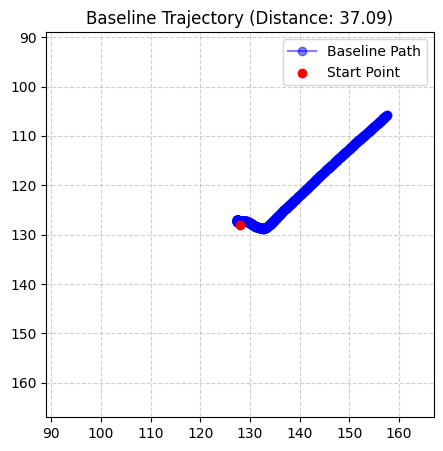

In [16]:
#@title Simulate and Measure Baseline Locomotion
import matplotlib.pyplot as plt
import numpy as np # Added just in case

#T = 1000
T = 750
 # Number of steps to test

current_state = state_p

# Arrays to store the trajectory
base_com_x, base_com_y = [], []

# Coordinate grids for calculating Center of Mass (ij indexing means x=rows, y=cols)
x_grid, y_grid = np.meshgrid(np.arange(SX), np.arange(SY), indexing='ij')

print("Running Baseline Simulation...")

with VideoWriter("fl_baseline.mp4", 60) as vid:
    for i in range(T):
        current_state = fl_p_step_fn(current_state, c_params)
        A_frame = np.array(jax.block_until_ready(current_state.A))
        P_frame = np.array(current_state.P)

        # --- TRACKING CENTER OF MASS ---
        mass = np.sum(A_frame[..., 0])
        if mass > 0.1: # As long as the blob hasn't evaporated
            cx = np.sum(A_frame[..., 0] * x_grid) / mass
            cy = np.sum(A_frame[..., 0] * y_grid) / mass
        else:
            # If it dies, it stops moving
            cx, cy = base_com_x[-1], base_com_y[-1]

        base_com_x.append(cx)
        base_com_y.append(cy)

        vid.add(state2img_P(A_frame, P_frame))

# Calculate total distance traveled from the starting center (mx, my)
final_cx, final_cy = base_com_x[-1], base_com_y[-1]
baseline_distance = np.sqrt((final_cx - mx)**2 + (final_cy - my)**2)

print(f"--- BASELINE ESTABLISHED ---")
print(f"Distance Traveled: {baseline_distance:.2f} pixels")

# --- THE FIX: SWAPPED COORDINATES FOR PLOTTING ---
plt.figure(figsize=(5, 5))

# We plot base_com_y (columns) on the X-axis, and base_com_x (rows) on the Y-axis
plt.plot(base_com_y, base_com_x, marker='o', color='blue', alpha=0.5, label='Baseline Path')
plt.scatter([my], [mx], color='red', label='Start Point', zorder=5)

plt.title(f"Baseline Trajectory (Distance: {baseline_distance:.2f})")

# Dynamically scale limits so the whole trajectory is visible
max_disp = max(np.max(np.abs(np.array(base_com_x) - mx)), np.max(np.abs(np.array(base_com_y) - my)))
padding = max(20, int(max_disp) + 10)

# We use 'my' for the X-axis limits, and 'mx' for the Y-axis limits
plt.xlim(my - padding, my + padding)
# We invert the Y-axis so the top of the video (row 0) is the top of the graph
plt.ylim(mx + padding, mx - padding)

plt.legend()
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

vid.show(width=360, height=360)

# Iteration 2 (Modified)

Evolving the smooth brain...
Gen 4 | Improved! Distance: 9.93
Gen 5 | Improved! Distance: 13.27
Gen 9 | Improved! Distance: 16.75
Gen 15 | Improved! Distance: 17.60

Rendering videos and plots...
Rendering Gen 0 (No Brain) → neuro_gen_0.mp4


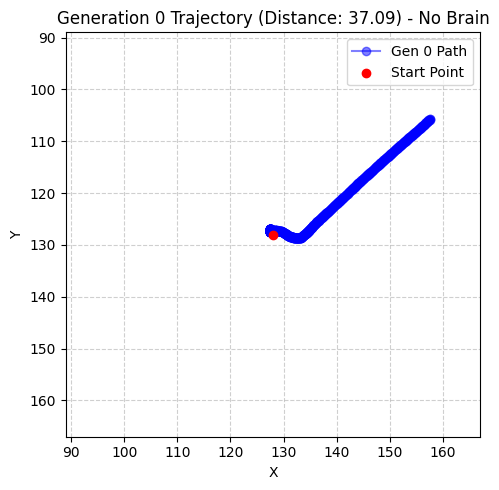

Rendering Gen 1 (With Brain) → neuro_gen_1.mp4


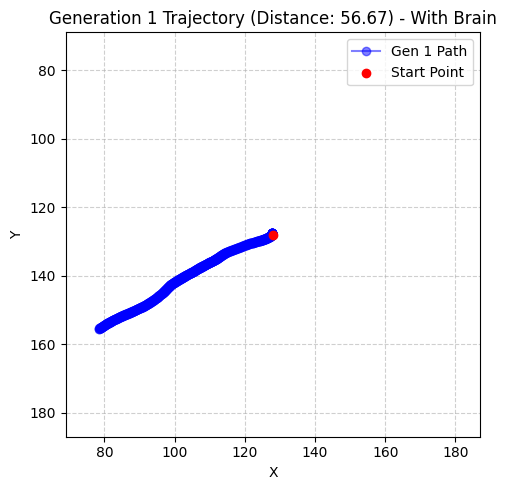

Rendering Gen 2 (With Brain) → neuro_gen_2.mp4


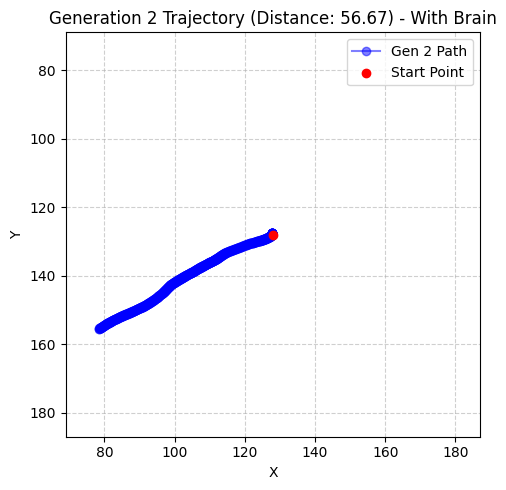

Rendering Gen 8 (With Brain) → neuro_gen_8.mp4


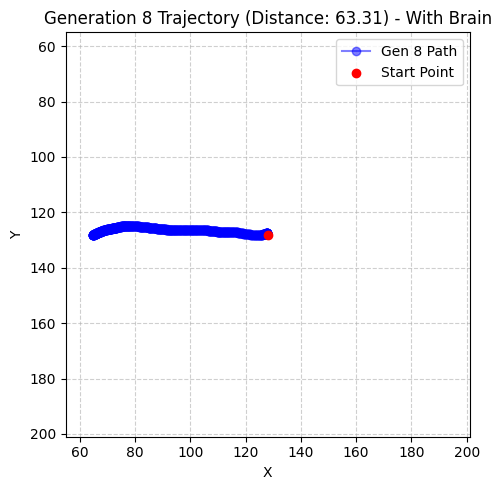

Rendering Gen 10 (With Brain) → neuro_gen_10.mp4


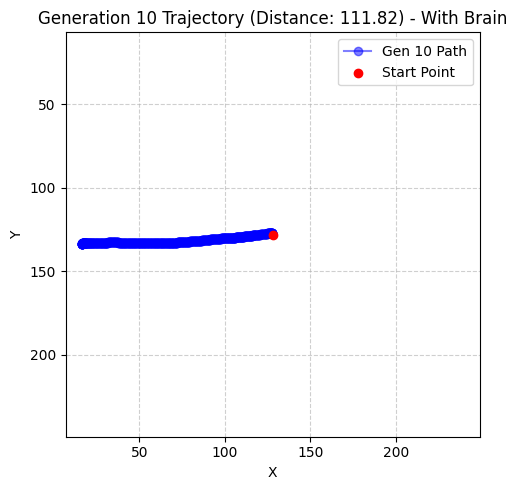

Rendering Gen 15 (With Brain) → neuro_gen_15.mp4


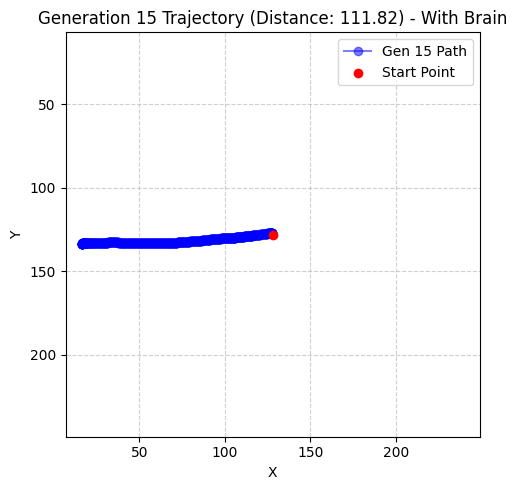

Rendering Gen 20 (With Brain) → neuro_gen_20.mp4


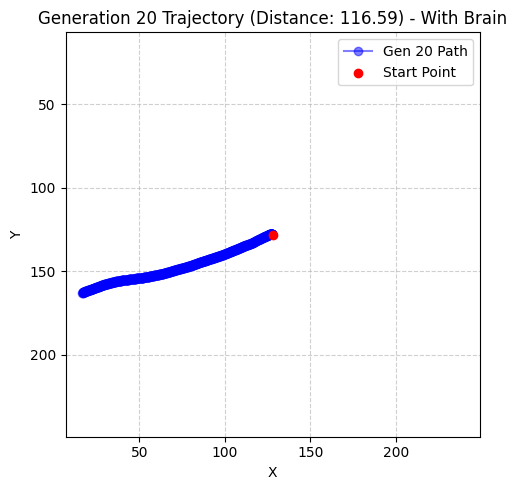

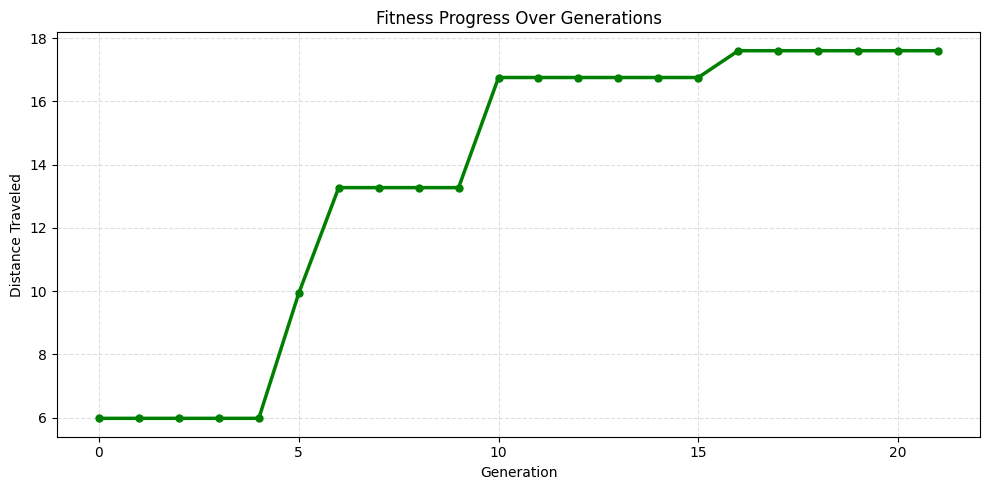


All done! Gen 0 should now match your baseline (white + similar movement).


In [17]:
#@title Neuro-Fluid Pipeline - Gen0 = No Brain + Matching Baseline Plots

import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
from functools import partial

# ==========================================
# 1. NEURO STEP (with static use_brain)
# ==========================================
@partial(jax.jit, static_argnums=(3,))
def neuro_step(state: State_P, params: CompiledParams, W: jnp.ndarray, use_brain: bool = True) -> State_P:
    A, P_base = state.A, state.P
    C_grad = sobel(A.sum(axis = -1, keepdims = True))

    if use_brain:
        brain_modulation = jnp.tanh(jnp.dot(C_grad[..., 0], W)) * 0.15
        P_pheno = jnp.clip(P_base + brain_modulation, 0.0, 1.0)
    else:
        P_pheno = P_base   # ← Gen 0: No brain, same as baseline

    # Lenia Physics
    fA = jnp.fft.fft2(A, axes=(0,1))
    fAk = fA[:, :, fl_p.config.c0]
    U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))
    U = growth(U, params.m, params.s) * P_pheno
    U = jnp.dstack([ U[:, :, fl_p.config.c1[c]].sum(axis=-1) for c in range(fl_p.config.C) ])

    F = sobel(U)
    alpha = jnp.clip((A[:, :, None, :]/2)**2, .0, 1.)
    F_base = jnp.clip(F * (1 - alpha) - C_grad * alpha,
                      -(fl_p.config.dd - fl_p.config.sigma),
                      fl_p.config.dd - fl_p.config.sigma)

    nA, nP_base = fl_p.RT.apply(A, P_base, F_base)
    return State_P(A=nA, P=nP_base)

# ==========================================
# 2. EVOLUTION (Brain always ON)
# ==========================================
x_grid, y_grid = np.meshgrid(np.arange(SX), np.arange(SY), indexing='ij')

def evaluate_fitness(W_matrix, init_state, steps=120):
    current = init_state
    for _ in range(steps):
        current = neuro_step(current, c_params, W_matrix, use_brain=True)
    final_A = np.array(jax.block_until_ready(current.A))
    mass = np.sum(final_A[..., 0])
    if mass < 1.0: return 0.0
    cx = np.sum(final_A[..., 0] * x_grid) / mass
    cy = np.sum(final_A[..., 0] * y_grid) / mass
    return np.sqrt((cx - mx)**2 + (cy - my)**2)

print("Evolving the smooth brain...")
best_W = jax.random.normal(jax.random.PRNGKey(42), (2, fl_p.config.nb_k)) * 0.1
best_fitness = evaluate_fitness(best_W, state_p)
fitness_history = [best_fitness]
W_history = [best_W.copy()]

for gen in range(0,21):
    noise = jax.random.normal(jax.random.PRNGKey(gen), best_W.shape) * 0.2
    mutant_W = best_W + noise
    mutant_fitness = evaluate_fitness(mutant_W, state_p)

    if mutant_fitness > best_fitness:
        best_W = mutant_W
        best_fitness = mutant_fitness
        print(f"Gen {gen} | Improved! Distance: {best_fitness:.2f}")

    fitness_history.append(best_fitness)
    W_history.append(best_W.copy())

# ==========================================
# 3. RENDERING + MATCHING BASELINE-STYLE PLOTS
# ==========================================
def state2img_clean(A):
    C = A.shape[-1]
    if C == 2:
        return np.dstack([A[..., 0], A[..., 0], A[..., 1]])  # Yellow + Blue
    return np.repeat(A, 3, axis=-1) if C == 1 else A[..., :3]

gens_to_render = [0, 1, 2,8,10,15,20]

print("\nRendering videos and plots...")

for gen in gens_to_render:
    W = W_history[gen] if gen < len(W_history) else best_W
    use_brain_flag = False if gen == 0 else True

    current_state = state_p
    com_x, com_y = [], []

    filename = f"neuro_gen_{gen}.mp4"
    brain_status = "No Brain" if not use_brain_flag else "With Brain"

    print(f"Rendering Gen {gen} ({brain_status}) → {filename}")

    with VideoWriter(filename, fps=60) as vid:
        for i in range(750):
            current_state = neuro_step(current_state, c_params, W, use_brain=use_brain_flag)
            A_frame = np.array(jax.block_until_ready(current_state.A))

            mass = np.sum(A_frame[..., 0])
            if mass > 0.1:
                cx = np.sum(A_frame[..., 0] * x_grid) / mass
                cy = np.sum(A_frame[..., 0] * y_grid) / mass
            else:
                cx, cy = com_x[-1] if com_x else mx, com_y[-1] if com_y else my

            com_x.append(cx)
            com_y.append(cy)
            vid.add(state2img_clean(A_frame))

    # === FINAL DISTANCE CALCULATION ===
    final_cx, final_cy = com_x[-1], com_y[-1]
    distance = np.sqrt((final_cx - mx)**2 + (final_cy - my)**2)

    # --- NEW WHITE BACKGROUND PLOT ---
    plt.figure(figsize=(5, 5))
    plt.plot(com_y, com_x, marker='o', color='blue', alpha=0.5, label=f'Gen {gen} Path')
    plt.scatter([my], [mx], color='red', label='Start Point', zorder=5)
    plt.title(f'Generation {gen} Trajectory (Distance: {distance:.2f}) - {brain_status}')
    plt.xlabel('X')
    plt.ylabel('Y')

    # Dynamically scale limits so the whole trajectory is visible
    max_disp = max(np.max(np.abs(np.array(com_x) - mx)), np.max(np.abs(np.array(com_y) - my)))
    padding = max(20, int(max_disp) + 10)

    plt.xlim(my - padding, my + padding)
    plt.ylim(mx + padding, mx - padding)

    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()
    plt.show()

# --- NEW WHITE BACKGROUND PLOT ---
plt.figure(figsize=(10, 5))
plt.plot(fitness_history, color='green', linewidth=2.5, marker='o', markersize=5)
plt.title('Fitness Progress Over Generations')
plt.xlabel('Generation')
plt.ylabel('Distance Traveled')
plt.grid(True, linestyle='--', alpha=0.4)
plt.tight_layout()
plt.show()

print("\nAll done! Gen 0 should now match your baseline (white + similar movement).")


# Final Iteration: Neuro-Fluid Ecology (PBC, Food, Decay & Brain)

In [ ]:
#@title Visualize Iteration 2 Final (Optimized) + Organism Tracking
import numpy as np
import jax
from scipy.ndimage import label, binary_closing

class OrganismTracker:
    """OOP Class to track distinct organisms using connected components with gap tolerance."""
    def __init__(self, threshold=0.2, gap_tolerance=5, min_mass=10.0):
        self.threshold = threshold
        self.gap_tolerance = gap_tolerance
        self.min_mass = min_mass
        # 8-connected structure to capture diagonal adjacencies
        self.structure = np.ones((3, 3), dtype=int)
        self.closing_struct = np.ones((gap_tolerance, gap_tolerance), dtype=int)

    def count_organisms(self, frame):
        # Sum across channels to get total activation mass per pixel
        mass_map = np.sum(frame, axis=-1)
        # Create a binary map where mass exceeds threshold
        binary_map = mass_map > self.threshold

        # Apply binary closing to merge nearby components separated by small gaps
        if self.gap_tolerance > 1:
            closed_map = binary_closing(binary_map, structure=self.closing_struct)
        else:
            closed_map = binary_map

        # Use scipy.ndimage.label to count distinct connected components
        labeled_array, num_features = label(closed_map, structure=self.structure)

        valid_orgs = 0
        for i in range(1, num_features + 1):
            org_mass = np.sum(mass_map[labeled_array == i])
            if org_mass >= self.min_mass:
                valid_orgs += 1

        return valid_orgs

T_vis = 4000
current_state = state_p
tracker = OrganismTracker(threshold=0.2, gap_tolerance=5, min_mass=10.0)

print("Rendering final optimized organism from Iteration 2 with Tracking...")

with VideoWriter("iter2_optimized_tracking.mp4", fps=60) as vid:
    for i in range(T_vis):
        # Using the optimized weights (best_W) from Iteration 2 evolution
        current_state = neuro_step(current_state, c_params, best_W, use_brain=True)
        A_frame = np.array(jax.block_until_ready(current_state.A))
        vid.add(state2img_clean(A_frame))

        # Check organism count every 200 steps
        if i % 200 == 0:
            num_orgs = tracker.count_organisms(A_frame)
            print(f"Step {i:4d} | Detected Organisms: {num_orgs}")

# Displaying directly in the cell output
vid.show(width=400, height=400, maxduration=1000000)


Rendering final optimized organism from Iteration 2 with Tracking...
Step    0 | Detected Organisms: 1
Step  200 | Detected Organisms: 1
Step  400 | Detected Organisms: 1
Step  600 | Detected Organisms: 1
Step  800 | Detected Organisms: 2
Step 1000 | Detected Organisms: 2
Step 1200 | Detected Organisms: 2
Step 1400 | Detected Organisms: 2
Step 1600 | Detected Organisms: 2
Step 1800 | Detected Organisms: 2
Step 2000 | Detected Organisms: 2
Step 2200 | Detected Organisms: 2
Step 2400 | Detected Organisms: 2
Step 2600 | Detected Organisms: 2
Step 2800 | Detected Organisms: 2
Step 3000 | Detected Organisms: 2
Step 3200 | Detected Organisms: 1
Step 3400 | Detected Organisms: 2
Step 3600 | Detected Organisms: 2
Step 3800 | Detected Organisms: 1


Rendering new simulation (Seed: 777) with SAME Brain Params...


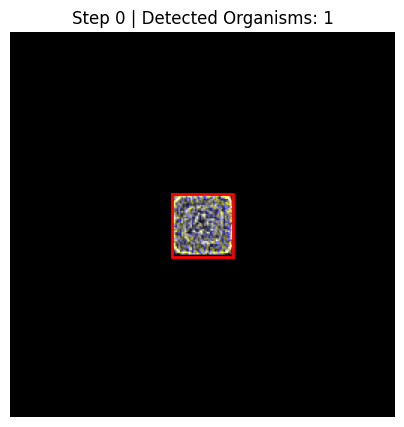

Step    0 | Detected Organisms: 1


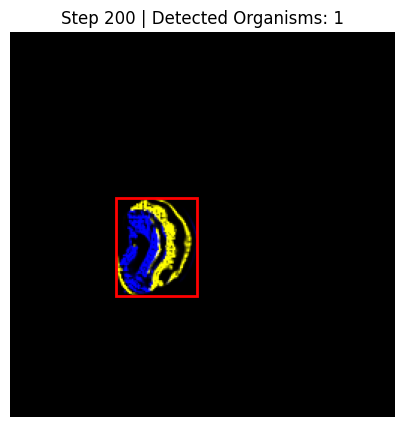

Step  200 | Detected Organisms: 1


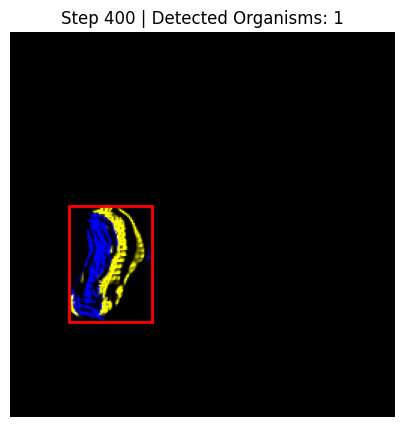

Step  400 | Detected Organisms: 1


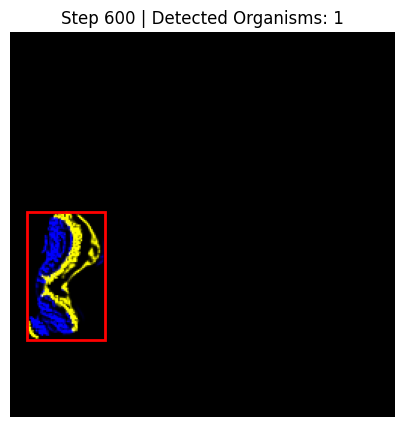

Step  600 | Detected Organisms: 1


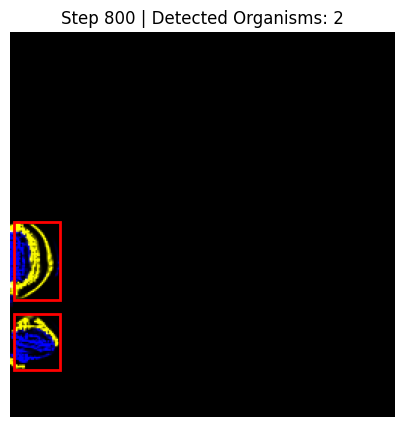

Step  800 | Detected Organisms: 2


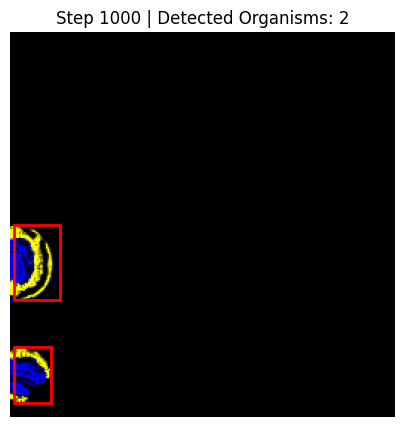

Step 1000 | Detected Organisms: 2


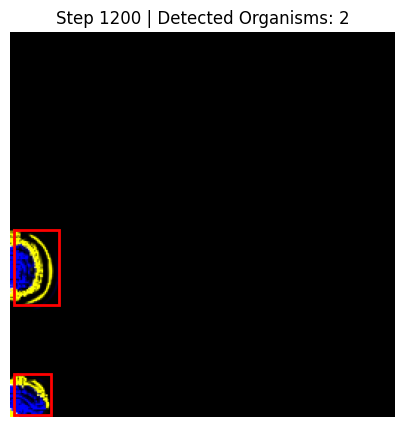

Step 1200 | Detected Organisms: 2


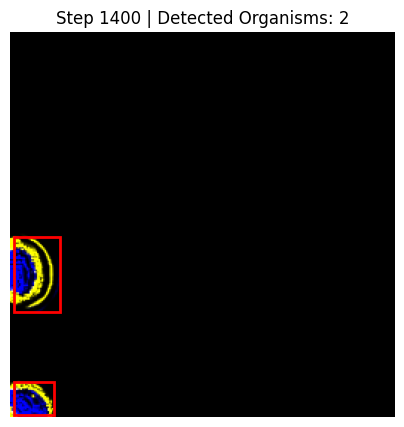

Step 1400 | Detected Organisms: 2


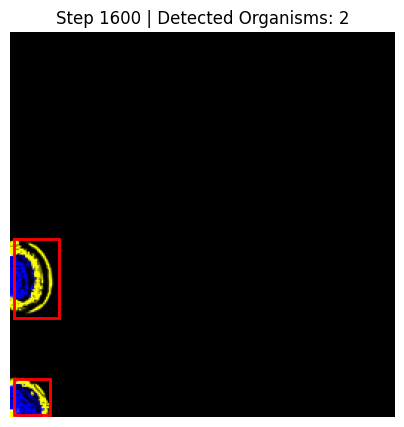

Step 1600 | Detected Organisms: 2


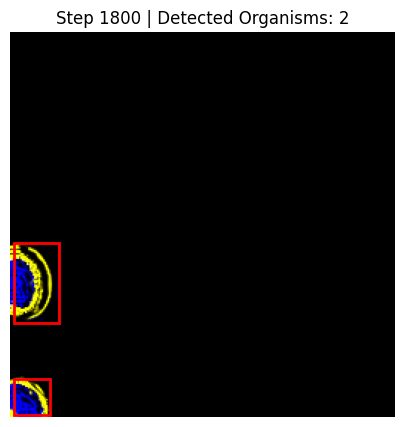

Step 1800 | Detected Organisms: 2


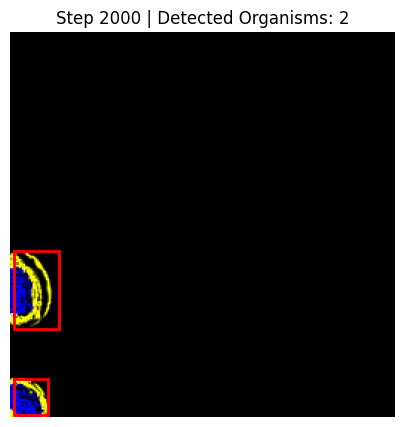

Step 2000 | Detected Organisms: 2


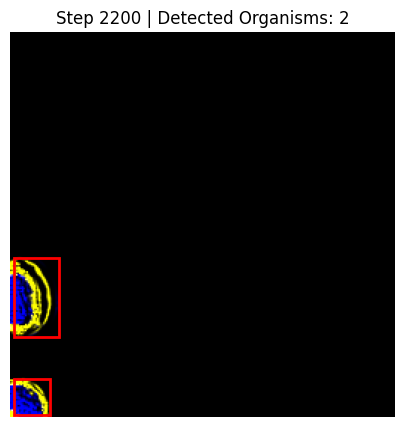

Step 2200 | Detected Organisms: 2


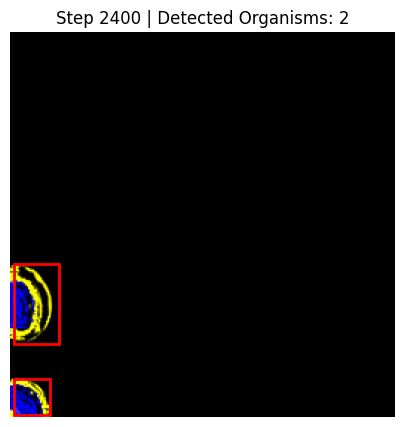

Step 2400 | Detected Organisms: 2


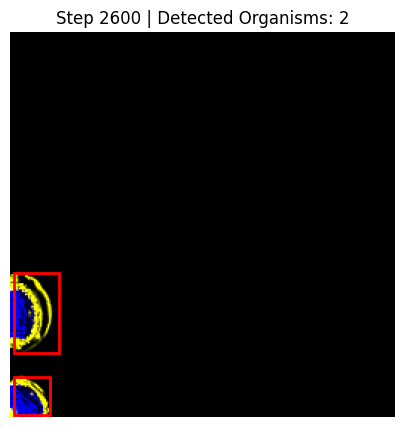

Step 2600 | Detected Organisms: 2


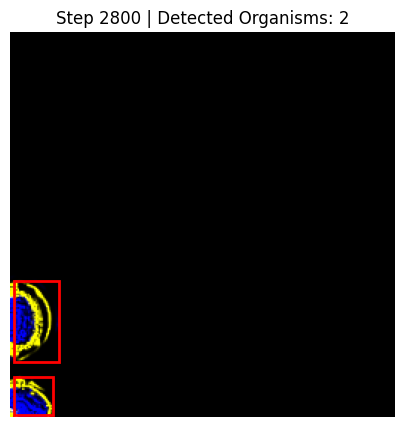

Step 2800 | Detected Organisms: 2


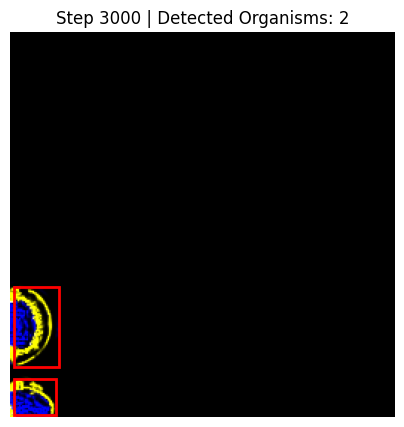

Step 3000 | Detected Organisms: 2


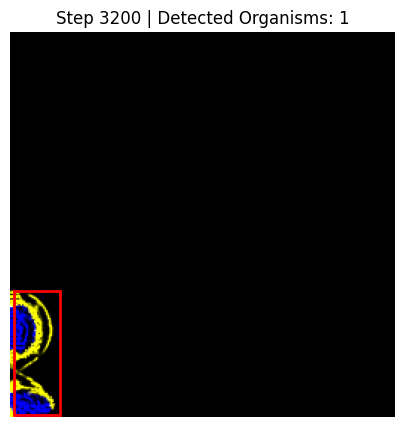

Step 3200 | Detected Organisms: 1


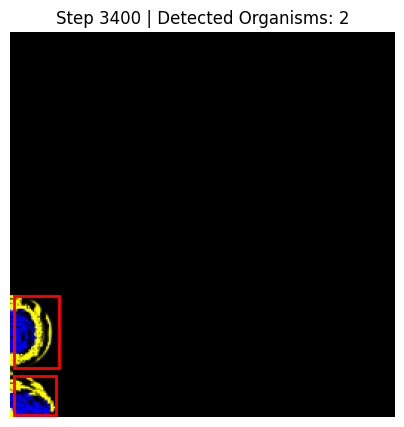

Step 3400 | Detected Organisms: 2


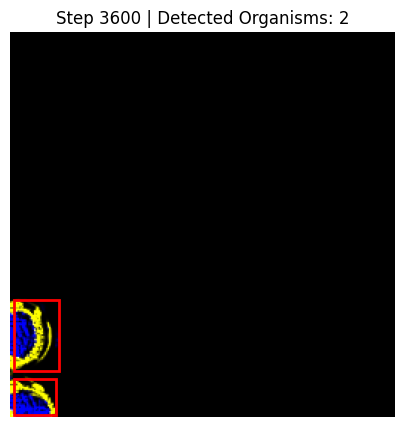

Step 3600 | Detected Organisms: 2


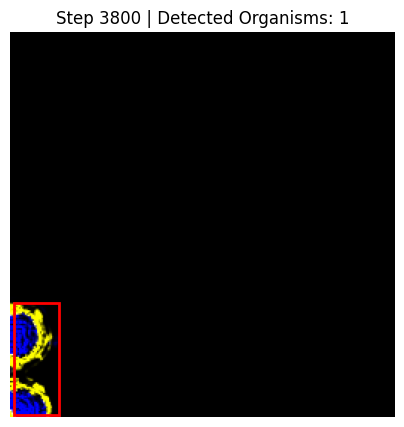

Step 3800 | Detected Organisms: 1


In [ ]:
#@title Run Simulation with New Seed (Same Brain & Physics) + Bounding Boxes
import jax
import jax.numpy as jnp
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import label, binary_closing, find_objects

class OrganismTracker:
    """OOP Class to track distinct organisms using connected components with gap tolerance."""
    def __init__(self, threshold=0.2, gap_tolerance=5, min_mass=10.0):
        self.threshold = threshold
        self.gap_tolerance = gap_tolerance
        self.min_mass = min_mass
        # 8-connected structure to capture diagonal adjacencies
        self.structure = np.ones((3, 3), dtype=int)
        # Large structure to bridge gaps between nearby pieces
        self.closing_struct = np.ones((gap_tolerance, gap_tolerance), dtype=int)

    def count_and_visualize(self, frame, step):
        # Sum across channels to get total activation mass per pixel
        mass_map = np.sum(frame, axis=-1)
        # Create a binary map where mass exceeds threshold
        binary_map = mass_map > self.threshold

        # Apply binary closing to merge nearby components separated by small gaps
        if self.gap_tolerance > 1:
            closed_map = binary_closing(binary_map, structure=self.closing_struct)
        else:
            closed_map = binary_map

        # Use scipy.ndimage.label to count distinct connected components
        labeled_array, num_features = label(closed_map, structure=self.structure)

        valid_boxes = []
        if num_features > 0:
            slices = find_objects(labeled_array)
            for i, slc in enumerate(slices):
                if slc is not None:
                    org_mass = np.sum(mass_map[labeled_array == (i + 1)])
                    if org_mass >= self.min_mass:
                        valid_boxes.append(slc)

        # Plotting the snapshot
        fig, ax = plt.subplots(figsize=(5, 5))
        # Show the clean image
        ax.imshow(state2img_clean(frame))

        # Find bounding boxes for the valid organisms
        for slc in valid_boxes:
            y_slice, x_slice = slc
            ymin, ymax = y_slice.start, y_slice.stop
            xmin, xmax = x_slice.start, x_slice.stop

            # Draw a red rectangle
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

        num_valid = len(valid_boxes)
        plt.title(f"Step {step} | Detected Organisms: {num_valid}")
        plt.axis('off')
        plt.show()

        print(f"Step {step:4d} | Detected Organisms: {num_valid}")

        return num_valid

# 1. Generate new initial state with a DIFFERENT seed
new_seed = 777 # Try a new seed
new_key = jax.random.PRNGKey(new_seed)
_, new_A_seed, new_P_seed = jax.random.split(new_key, 3)

# NOTE: We keep c_params the same so the physics rules are identical to what the brain (best_W) evolved on.
mx, my = SX//2, SY//2
new_A = jnp.zeros((SX, SY, C))
new_P = jnp.zeros((SX, SY, nb_k))
centers = [(128, 128)]

for x, y in centers:
    new_key, Akey, Pkey = jax.random.split(new_key, 3)
    new_A = new_A.at[x-20:x+20, y-20:y+20, :].set(
        jax.random.uniform(Akey, (40, 40, 1))
    )
    new_P = new_P.at[x-20:x+20, y-20:y+20, :].set(
        jnp.ones((40, 40, nb_k)) * jax.random.uniform(Pkey, (1, 1, nb_k))
    )
new_state_p = State_P(A=new_A, P=new_P)

# 2. Run the simulation
T_vis = 4000
current_state = new_state_p

# Using the updated tracker with a tighter gap tolerance (5), higher threshold (0.2), and min_mass
tracker = OrganismTracker(threshold=0.2, gap_tolerance=5, min_mass=10.0)

print(f"Rendering new simulation (Seed: {new_seed}) with SAME Brain Params...")

with VideoWriter("iter2_new_seed_tracking.mp4", fps=60) as vid:
    for i in range(T_vis):
        # Use the SAME best_W from before
        current_state = neuro_step(current_state, c_params, best_W, use_brain=True)
        A_frame = np.array(jax.block_until_ready(current_state.A))
        vid.add(state2img_clean(A_frame))

        # Check organism count and print snapshot every 200 steps
        if i % 200 == 0:
            num_orgs = tracker.count_and_visualize(A_frame, i)

# Displaying directly in the cell output
vid.show(width=400, height=400, maxduration=1000000)


# PBC (Periodic Boundary Conditions)

Rendering Torus (PBC) simulation with wrapped Sobel and centered organism tracking...


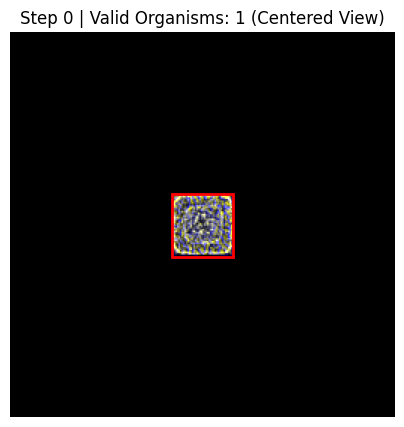

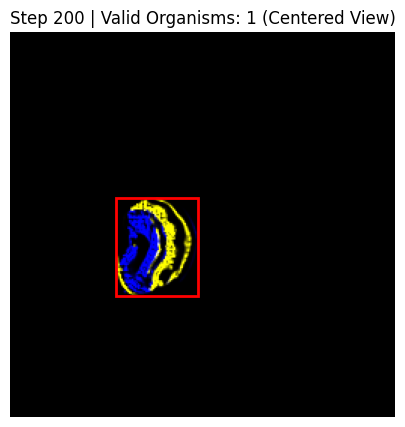

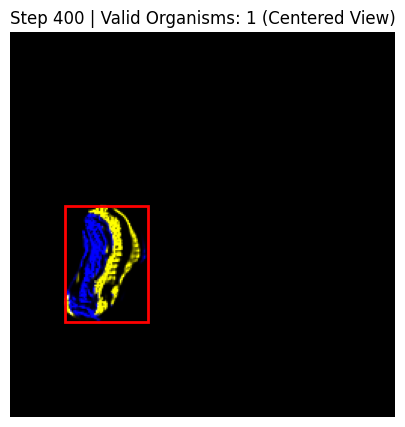

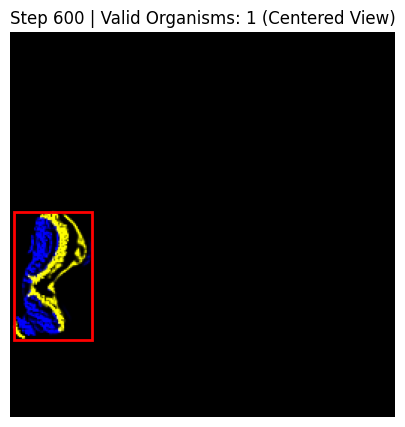

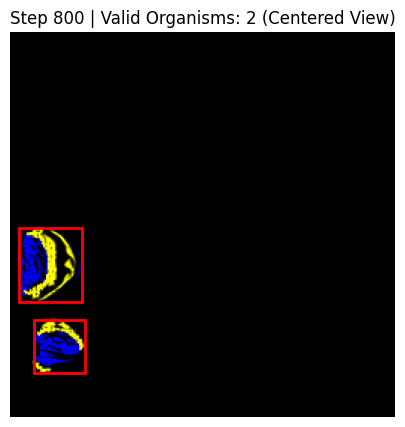

...

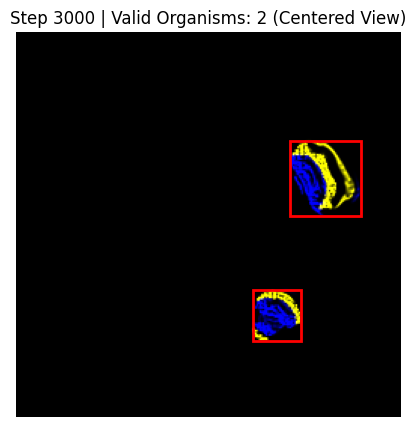

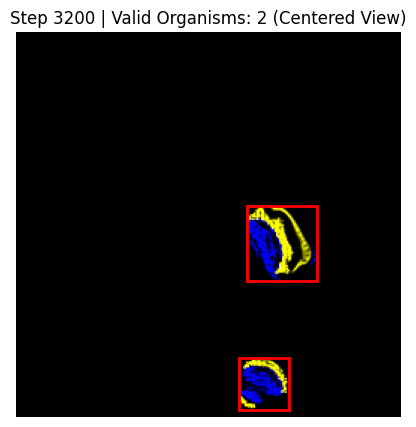

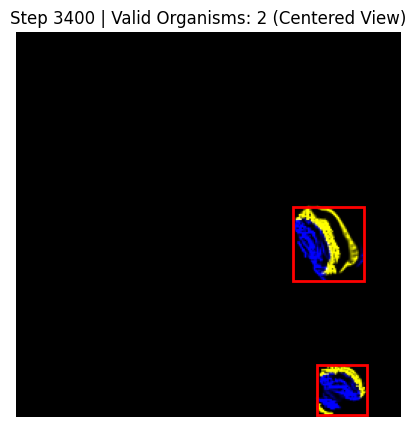

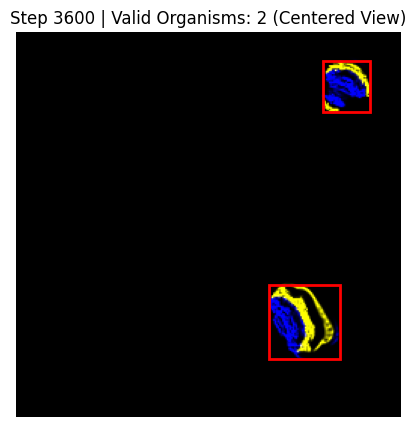

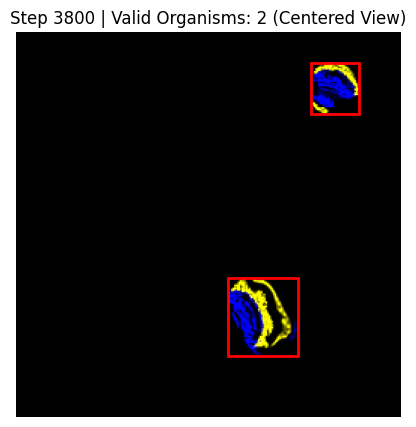

In [ ]:
#@title Setup Torus Environment & Run Simulation
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import numpy as np
from functools import partial
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy.ndimage import label, binary_closing, find_objects

# --- FIX 1: PBC-Aware Sobel Filter ---
# The original sobel used zero-padding, causing smudging and mass loss at edges.
kx = jnp.array([[1., 0., -1.], [2., 0., -2.], [1., 0., -1.]])
ky = jnp.transpose(kx)

@jax.jit
def sobel_torus(A):
    # Pad with 'wrap' to ensure periodic boundaries for the convolutions
    A_pad = jnp.pad(A, ((1, 1), (1, 1), (0, 0)), mode='wrap')
    sx = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], kx, mode='valid') for c in range(A.shape[-1])])
    sy = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], ky, mode='valid') for c in range(A.shape[-1])])
    return jnp.concatenate((sy[:, :, None, :], sx[:, :, None, :]), axis=2)

# 1. New Config with Torus (PBC)
config_torus = Config_P(SX=SX, SY=SY, nb_k=nb_k, C=C,
                        c0=c0, c1=c1, dt=dt, theta_A=theta_A,
                        mix=mixing_rule, border='torus')
fl_p_torus = FlowLeniaParams(config_torus)

# 2. Redefine neuro_step for the torus environment using sobel_torus
@partial(jax.jit, static_argnums=(3,))
def neuro_step_torus(state: State_P, params: CompiledParams, W: jnp.ndarray, use_brain: bool = True) -> State_P:
    A, P_base = state.A, state.P
    C_grad = sobel_torus(A.sum(axis=-1, keepdims=True)) # <-- Using wrap-padded sobel

    if use_brain:
        brain_modulation = jnp.tanh(jnp.dot(C_grad[..., 0], W)) * 0.15
        P_pheno = jnp.clip(P_base + brain_modulation, 0.0, 1.0)
    else:
        P_pheno = P_base

    # Lenia Physics
    fA = jnp.fft.fft2(A, axes=(0,1))
    fAk = fA[:, :, fl_p_torus.config.c0]
    U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))
    U = growth(U, params.m, params.s) * P_pheno
    U = jnp.dstack([ U[:, :, fl_p_torus.config.c1[c]].sum(axis=-1) for c in range(fl_p_torus.config.C) ])

    F = sobel_torus(U) # <-- Using wrap-padded sobel
    alpha = jnp.clip((A[:, :, None, :]/2)**2, .0, 1.)
    F_base = jnp.clip(F * (1 - alpha) - C_grad * alpha,
                      -(fl_p_torus.config.dd - fl_p_torus.config.sigma),
                      fl_p_torus.config.dd - fl_p_torus.config.sigma)

    nA, nP_base = fl_p_torus.RT.apply(A, P_base, F_base)
    return State_P(A=nA, P=nP_base)

# --- FIX 2 & 3: Torus Tracker with Min Mass ---
class OrganismTrackerTorus:
    def __init__(self, threshold=0.2, gap_tolerance=5, min_mass=20.0):
        self.threshold = threshold
        self.gap_tolerance = gap_tolerance
        self.min_mass = min_mass
        self.structure = np.ones((3, 3), dtype=int)
        self.closing_struct = np.ones((gap_tolerance, gap_tolerance), dtype=int)

    def count_and_visualize(self, frame, step):
        mass_map = np.sum(frame, axis=-1)

        # Find the emptiest "corridors" to wrap the map around before labeling
        empty_row = np.argmin(np.sum(mass_map, axis=1))
        empty_col = np.argmin(np.sum(mass_map, axis=0))
        shift_x, shift_y = -empty_row, -empty_col

        # Roll the frame so organisms aren't split by the boundary
        rolled_mass = np.roll(mass_map, (shift_x, shift_y), axis=(0, 1))
        rolled_frame = np.roll(frame, (shift_x, shift_y), axis=(0, 1))

        binary_map = rolled_mass > self.threshold
        if self.gap_tolerance > 1:
            closed_map = binary_closing(binary_map, structure=self.closing_struct)
        else:
            closed_map = binary_map

        labeled_array, num_features = label(closed_map, structure=self.structure)

        valid_boxes = []
        if num_features > 0:
            slices = find_objects(labeled_array)
            for i, slc in enumerate(slices):
                if slc is not None:
                    # FIX 3: Check min mass threshold
                    org_mass = np.sum(rolled_mass[slc][labeled_array[slc] == (i + 1)])
                    if org_mass >= self.min_mass:
                        valid_boxes.append(slc)

        # Plotting the rolled, centered view
        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(state2img_clean(rolled_frame))
        for slc in valid_boxes:
            y_slice, x_slice = slc
            ymin, ymax = y_slice.start, y_slice.stop
            xmin, xmax = x_slice.start, x_slice.stop
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)

        plt.title(f"Step {step} | Valid Organisms: {len(valid_boxes)} (Centered View)")
        plt.axis('off')
        plt.show()
        return len(valid_boxes)

# 3. Initialize state with exact same params as Iteration 2 baseline
seed_torus = 777
key_torus = jax.random.PRNGKey(seed_torus)
_, A_seed_t, P_seed_t = jax.random.split(key_torus, 3)

new_A_t = jnp.zeros((SX, SY, C))
new_P_t = jnp.zeros((SX, SY, nb_k))

centers = [(128, 128)]
for x, y in centers:
    key_torus, Akey, Pkey = jax.random.split(key_torus, 3)
    new_A_t = new_A_t.at[x-20:x+20, y-20:y+20, :].set(
        jax.random.uniform(Akey, (40, 40, 1))
    )
    new_P_t = new_P_t.at[x-20:x+20, y-20:y+20, :].set(
        jnp.ones((40, 40, nb_k)) * jax.random.uniform(Pkey, (1, 1, nb_k))
    )
state_torus = State_P(A=new_A_t, P=new_P_t)

# 4. Run Simulation with tracking
T_vis_torus = 4000
current_state = state_torus
tracker_torus = OrganismTrackerTorus(threshold=0.2, gap_tolerance=5, min_mass=20.0)

print("Rendering Torus (PBC) simulation with wrapped Sobel and centered organism tracking...")

with VideoWriter("pbc_tracking_fixed.mp4", fps=60) as vid:
    for i in range(T_vis_torus):
        current_state = neuro_step_torus(current_state, c_params, best_W, use_brain=True)
        A_frame = np.array(jax.block_until_ready(current_state.A))
        vid.add(state2img_clean(A_frame))

        if i % 200 == 0:
            num_orgs = tracker_torus.count_and_visualize(A_frame, i)

vid.show(width=400, height=400, maxduration=1000000)

# Food Optimization and ES Foraging

Optimizing Brain with Evolution Strategies (ES) + vmap...
Theoretical Maximum Mass (A): 2630.35
Compiling JAX functions... (this may take a moment)
Gen  1 | Pop Mean Fitness: 1616.85 | Best Fit in Pop: 1917.16 | Overall Best: 1917.16 / 2630.35
Gen  2 | Pop Mean Fitness: 1849.68 | Best Fit in Pop: 2117.37 | Overall Best: 2117.37 / 2630.35
Gen  3 | Pop Mean Fitness: 2120.00 | Best Fit in Pop: 2128.07 | Overall Best: 2128.07 / 2630.35
Gen  4 | Pop Mean Fitness: 2137.87 | Best Fit in Pop: 2291.72 | Overall Best: 2291.72 / 2630.35
Gen  5 | Pop Mean Fitness: 2262.98 | Best Fit in Pop: 2379.32 | Overall Best: 2379.32 / 2630.35
Gen  6 | Pop Mean Fitness: 2319.19 | Best Fit in Pop: 2691.30 | Overall Best: 2691.30 / 2630.35
  -> Near max mass reached! Countdown to stop: 1/3
Gen  7 | Pop Mean Fitness: 2408.66 | Best Fit in Pop: 2834.13 | Overall Best: 2834.13 / 2630.35
  -> Near max mass reached! Countdown to stop: 2/3
Gen  8 | Pop Mean Fitness: 2694.98 | Best Fit in Pop: 2834.42 | Overall Best: 

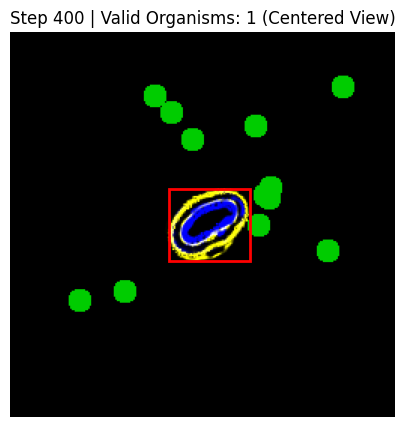


Rendering Optimized Brain (ES) (food_gen_optimized.mp4)...


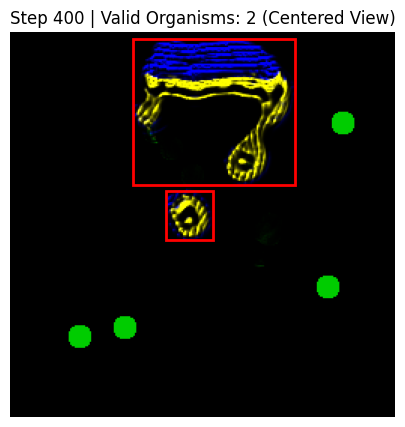

In [ ]:
#Food Optimization & ES Foraging
import jax
import jax.numpy as jnp
import jax.scipy as jsp
import numpy as np
from functools import partial
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import chex
from scipy.ndimage import label, binary_closing, find_objects

# --- 1. State Definition & Sobel Torus ---
kx = jnp.array([[1., 0., -1.], [2., 0., -2.], [1., 0., -1.]])
ky = jnp.transpose(kx)

@jax.jit
def sobel_torus(A):
    A_pad = jnp.pad(A, ((1, 1), (1, 1), (0, 0)), mode='wrap')
    sx = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], kx, mode='valid') for c in range(A.shape[-1])])
    sy = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], ky, mode='valid') for c in range(A.shape[-1])])
    return jnp.concatenate((sy[:, :, None, :], sx[:, :, None, :]), axis=2)

@chex.dataclass
class State_F:
    A: jnp.ndarray
    P: jnp.ndarray
    Food: jnp.ndarray

# 1. New Config with Torus (PBC)
config_torus = Config_P(SX=SX, SY=SY, nb_k=nb_k, C=C,
                        c0=c0, c1=c1, dt=dt, theta_A=theta_A,
                        mix=mixing_rule, border='torus')
fl_p_torus = FlowLeniaParams(config_torus)

# --- 2. Step Function (Locomotion + Engulfment) ---
@partial(jax.jit, static_argnums=(3,))
def neuro_step_food(state: State_F, params: CompiledParams, W: jnp.ndarray, use_brain: bool = True) -> State_F:
    A, P_base, Food = state.A, state.P, state.Food

    # Gradients
    C_grad = sobel_torus(A.sum(axis=-1, keepdims=True))
    Food_grad = sobel_torus(Food)

    # Brain Modulation (Reads both C_grad and Food_grad)
    if use_brain:
        # W has shape (4, nb_k).
        sensory_input = jnp.concatenate([C_grad[..., 0], Food_grad[..., 0] * 5.0], axis=-1)
        brain_modulation = jnp.tanh(jnp.dot(sensory_input, W)) * 0.15
        P_pheno = jnp.clip(P_base + brain_modulation, 0.0, 1.0)
    else:
        P_pheno = P_base

    # Lenia Physics
    fA = jnp.fft.fft2(A, axes=(0,1))
    fAk = fA[:, :, fl_p_torus.config.c0]
    U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))
    U = growth(U, params.m, params.s) * P_pheno
    U = jnp.dstack([ U[:, :, fl_p_torus.config.c1[c]].sum(axis=-1) for c in range(fl_p_torus.config.C) ])

    F = sobel_torus(U)
    alpha = jnp.clip((A[:, :, None, :]/2)**2, .0, 1.)
    F_base = jnp.clip(F * (1 - alpha) - C_grad * alpha,
                      -(fl_p_torus.config.dd - fl_p_torus.config.sigma),
                      fl_p_torus.config.dd - fl_p_torus.config.sigma)

    nA, nP_base = fl_p_torus.RT.apply(A, P_base, F_base)

    # Engulfment & Eating Mechanics
    local_mass = nA.sum(axis=-1, keepdims=True)
    # Require high local mass to absorb food: only if local mass > 0.8
    # This forces the CA to learn to wrap around or concentrate mass over the food.
    mass_threshold_mask = jnp.where(local_mass > 0.8, 1.0, 0.0)
    overlap = mass_threshold_mask * Food
    eating_rate = 0.1 # Slower digestion over time
    eaten = overlap * eating_rate

    # Grow organism and shrink food
    nA = nA + (eaten / fl_p_torus.config.C)
    nFood = Food - eaten

    return State_F(A=nA, P=nP_base, Food=nFood)

# --- 3. Torus Tracker for Organism & Food ---
def state2img_clean_food(A, Food):
    C_img = A.shape[-1]
    A_base = np.dstack([A[..., 0], A[..., 0], A[..., 1]]) if C_img == 2 else np.repeat(A, 3, axis=-1)
    A_base[..., 1] = np.clip(A_base[..., 1] + Food[..., 0]*0.8, 0, 1) # Green Food
    return np.clip(A_base, 0, 1)

class OrganismTrackerFood:
    def __init__(self, threshold=0.2, gap_tolerance=5, min_mass=20.0):
        self.threshold = threshold
        self.gap_tolerance = gap_tolerance
        self.min_mass = min_mass
        self.structure = np.ones((3, 3), dtype=int)
        self.closing_struct = np.ones((gap_tolerance, gap_tolerance), dtype=int)

    def count_and_visualize(self, frame, food_frame, step):
        mass_map = np.sum(frame, axis=-1)
        empty_row = np.argmin(np.sum(mass_map, axis=1))
        empty_col = np.argmin(np.sum(mass_map, axis=0))
        shift_x, shift_y = -empty_row, -empty_col

        rolled_mass = np.roll(mass_map, (shift_x, shift_y), axis=(0, 1))
        rolled_frame = np.roll(frame, (shift_x, shift_y), axis=(0, 1))
        rolled_food = np.roll(food_frame, (shift_x, shift_y), axis=(0, 1))

        binary_map = rolled_mass > self.threshold
        closed_map = binary_closing(binary_map, structure=self.closing_struct) if self.gap_tolerance > 1 else binary_map
        labeled_array, num_features = label(closed_map, structure=self.structure)

        valid_boxes = []
        if num_features > 0:
            slices = find_objects(labeled_array)
            for i, slc in enumerate(slices):
                if slc is not None:
                    if np.sum(rolled_mass[slc][labeled_array[slc] == (i + 1)]) >= self.min_mass:
                        valid_boxes.append(slc)

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(state2img_clean_food(rolled_frame, rolled_food))
        for slc in valid_boxes:
            y_slice, x_slice = slc
            ymin, ymax = y_slice.start, y_slice.stop
            xmin, xmax = x_slice.start, x_slice.stop
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
        plt.title(f"Step {step} | Valid Organisms: {len(valid_boxes)} (Centered View)")
        plt.axis('off')
        plt.show()
        return len(valid_boxes)

# --- 4. Initialization (Same exact params) ---
seed_torus = 777
key_torus = jax.random.PRNGKey(seed_torus)
_, A_seed_t, P_seed_t = jax.random.split(key_torus, 3)

new_A_t = jnp.zeros((SX, SY, C))
new_P_t = jnp.zeros((SX, SY, nb_k))
centers = [(128, 128)]
for x, y in centers:
    key_torus, Akey, Pkey = jax.random.split(key_torus, 3)
    new_A_t = new_A_t.at[x-20:x+20, y-20:y+20, :].set(jax.random.uniform(Akey, (40, 40, 1)))
    new_P_t = new_P_t.at[x-20:x+20, y-20:y+20, :].set(jnp.ones((40, 40, nb_k)) * jax.random.uniform(Pkey, (1, 1, nb_k)))

def spawn_food(num_food=12, radius=8):
    Food = jnp.zeros((SX, SY, 1))
    X, Y = jnp.meshgrid(jnp.arange(SX), jnp.arange(SY), indexing='ij')
    k = jax.random.PRNGKey(1234)
    for _ in range(num_food):
        k, subk = jax.random.split(k)
        fx, fy = jax.random.randint(subk, (2,), minval=30, maxval=SX-30)
        dist = jnp.sqrt((X - fx)**2 + (Y - fy)**2)
        Food = Food + jnp.where(dist < radius, 1.0, 0.0)[..., None]
    return jnp.clip(Food, 0.0, 1.0)

state_food_init = State_F(A=new_A_t, P=new_P_t, Food=spawn_food())

# Calculate Theoretical Maximum Mass
initial_A_mass = jnp.sum(state_food_init.A)
initial_food_mass = jnp.sum(state_food_init.Food)
max_possible_A = initial_A_mass + (initial_food_mass / fl_p_torus.config.C)

# --- 5. ES Optimization Loop (Vmap over Population) ---
@partial(jax.jit, static_argnums=(2,))
def rollout_food(W_matrix, init_state, steps):
    def scan_step(carry, x):
        state = neuro_step_food(carry, c_params, W_matrix, use_brain=True)
        return state, None
    final_state, _ = jax.lax.scan(scan_step, init_state, None, length=steps)
    return final_state

@partial(jax.jit, static_argnums=(2,))
def evaluate_pop(W_pop, init_state, steps):
    def single_eval(W):
        final_state = rollout_food(W, init_state, steps)
        return jnp.sum(final_state.A)
    # Vectorize across the population to evaluate multiple brains at once
    return jax.vmap(single_eval)(W_pop)

print("Optimizing Brain with Evolution Strategies (ES) + vmap...")
print(f"Theoretical Maximum Mass (A): {max_possible_A:.2f}")
best_W_food = jax.random.normal(jax.random.PRNGKey(42), (4, fl_p_torus.config.nb_k)) * 0.1

# ES Hyperparameters
pop_size = 16
sigma_es = 0.1
lr = 0.05
best_fitness = 0.0
key_es = jax.random.PRNGKey(100)

plateau_counter = 0

print("Compiling JAX functions... (this may take a moment)")
for gen in range(1, 21): # Maximum 20 Generations
    key_es, subkey = jax.random.split(key_es)
    # Generate mutated population
    noise = jax.random.normal(subkey, (pop_size,) + best_W_food.shape)
    W_pop = best_W_food + sigma_es * noise

    # Evaluate entire population in parallel (Increased steps for more foraging time)
    fitnesses = evaluate_pop(W_pop, state_food_init, 300)

    # Standardize fitness for natural gradient
    fit_mean = jnp.mean(fitnesses)
    fit_std = jnp.std(fitnesses)
    normalized_fitness = (fitnesses - fit_mean) / (fit_std + 1e-8)

    # ES Update Step (Gradient Ascent on Expected Fitness)
    grad = (1.0 / (pop_size * sigma_es)) * jnp.sum(noise * normalized_fitness[:, None, None], axis=0)
    best_W_food = best_W_food + lr * grad

    max_fit = jnp.max(fitnesses)
    if max_fit > best_fitness:
        best_fitness = max_fit

    print(f"Gen {gen:2d} | Pop Mean Fitness: {fit_mean:.2f} | Best Fit in Pop: {max_fit:.2f} | Overall Best: {best_fitness:.2f} / {max_possible_A:.2f}")

    # Early stopping condition based on maximum theoretical mass (~95% threshold to account for unreachables)
    if best_fitness >= 0.95 * max_possible_A:
        plateau_counter += 1
        print(f"  -> Near max mass reached! Countdown to stop: {plateau_counter}/3")
        if plateau_counter >= 3:
            print("Stopping optimization early as max mass capacity has been consistently achieved.")
            break

# --- 6. Rendering & Tracking ---
def render_gen(W, use_brain, filename, title):
    print(f"\nRendering {title} ({filename})...")
    current = state_food_init
    tracker = OrganismTrackerFood(threshold=0.2, gap_tolerance=5, min_mass=20.0)

    with VideoWriter(filename, fps=60) as vid:
        for i in range(800):
            current = neuro_step_food(current, c_params, W, use_brain=use_brain)
            A_frame = np.array(jax.block_until_ready(current.A))
            Food_frame = np.array(current.Food)
            vid.add(state2img_clean_food(A_frame, Food_frame))

            if i > 0 and i % 400 == 0:
                tracker.count_and_visualize(A_frame, Food_frame, i)
    vid.show(width=400, height=400)

render_gen(best_W_food, False, "food_gen_0.mp4", "Generation 0 (No Brain)")
render_gen(best_W_food, True, "food_gen_optimized.mp4", "Optimized Brain (ES)")

In [ ]:
#@title Long Simulation (4000 Steps) with Optimized Brain

T_long = 10000

print(f"Running long simulation for {T_long} steps with optimized brain...")
current_state = state_food_init

with VideoWriter("food_long_simulation.mp4", fps=60) as vid:
    for i in range(T_long):
        # Step the simulation forward
        current_state = neuro_step_food(current_state, c_params, best_W_food, use_brain=True)

        # Extract frames to numpy arrays
        A_frame = np.array(jax.block_until_ready(current_state.A))
        Food_frame = np.array(current_state.Food)

        # Add frame to the video
        vid.add(state2img_clean_food(A_frame, Food_frame))

        if i > 0 and i % 500 == 0:
            print(f"Step {i}/{T_long} completed...")

print("Simulation complete. Displaying video...")
vid.show(width=400, height=400, maxduration=1000000)


Output hidden; open in https://colab.research.google.com to view.

#Final Project Completion: Multi-Agent Ecology & Online Spatial Evolution

This cell brings everything together:
1. **Food Environment:** Organisms must forage.
2. **Spatial Brains ($W_{grid}$):** Each organism carries its own unique, localized brain parameters.
3. **Sensory Integration:** The brain reads both the Body Gradient and the Food Gradient.
4. **Individuality Tracker & Repulsion:** Prevents merging and tracks distinct entities.
5. **Online Evolution:** Brains mutate every 100 steps based on their survival in the environment.

In [ ]:
import jax
import jax.numpy as jnp
import numpy as np
import chex
from functools import partial
from scipy.ndimage import label, center_of_mass
import jax.scipy as jsp

# --- 0. Helper Functions ---
kx = jnp.array([[1., 0., -1.], [2., 0., -2.], [1., 0., -1.]])
ky = jnp.transpose(kx)

@jax.jit
def sobel_torus(A):
    A_pad = jnp.pad(A, ((1, 1), (1, 1), (0, 0)), mode='wrap')
    sx = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], kx, mode='valid') for c in range(A.shape[-1])])
    sy = jnp.dstack([jsp.signal.convolve2d(A_pad[:, :, c], ky, mode='valid') for c in range(A.shape[-1])])
    return jnp.concatenate((sy[:, :, None, :], sx[:, :, None, :]), axis=2)

# --- 1. System Configuration ---
nb_k_multi = 5
C_multi = 2
SX_multi, SY_multi = 128, 128 # 128x128 grid for computational feasibility in multi-agent

M_multi = np.ones((C_multi, C_multi), dtype=int) * nb_k_multi
nb_k_multi = int(M_multi.sum())
c0_m, c1_m = conn_from_matrix(M_multi)

config_multi = Config_P(SX=SX_multi, SY=SY_multi, nb_k=nb_k_multi, C=C_multi,
                        c0=c0_m, c1=c1_m, dt=0.2, theta_A=2.0,
                        mix='stoch', border='torus')
fl_multi = FlowLeniaParams(config_multi)

# --- 2. State Definition ---
@chex.dataclass
class State_MultiEcology:
    A: jnp.ndarray
    P: jnp.ndarray
    Food: jnp.ndarray
    W_grid: jnp.ndarray # Spatial brain weights (SX, SY, 4, nb_k)

# --- 3. Step Function ---
@partial(jax.jit, static_argnums=(2,))
def neuro_step_ecology(state: State_MultiEcology, params: CompiledParams, use_brain: bool = True) -> State_MultiEcology:
    A, P_base, Food, W_grid = state.A, state.P, state.Food, state.W_grid

    # Sensory inputs: 2 components from body, 2 from food
    C_grad = sobel_torus(A.sum(axis=-1, keepdims=True))
    Food_grad = sobel_torus(Food)

    if use_brain:
        # Combine inputs: shape (SX, SY, 4)
        sensory_input = jnp.concatenate([C_grad[..., 0], Food_grad[..., 0] * 5.0], axis=-1)

        # Spatial Brain modulation: Einsum computes dot product pixel-by-pixel
        # sensory_input (x, y, 4), W_grid (x, y, 4, nb_k) -> brain_modulation (x, y, nb_k)
        brain_modulation = jnp.tanh(jnp.einsum('xyi,xyik->xyk', sensory_input, W_grid)) * 0.15
        P_pheno = jnp.clip(P_base + brain_modulation, 0.0, 1.0)
    else:
        P_pheno = P_base

    # Physics Update
    fA = jnp.fft.fft2(A, axes=(0,1))
    fAk = fA[:, :, fl_multi.config.c0]
    U = jnp.real(jnp.fft.ifft2(params.fK * fAk, axes=(0,1)))
    U = growth(U, params.m, params.s) * P_pheno
    U = jnp.dstack([ U[:, :, fl_multi.config.c1[c]].sum(axis=-1) for c in range(fl_multi.config.C) ])

    F = sobel_torus(U)
    alpha = jnp.clip((A[:, :, None, :]/2)**2, .0, 1.)
    F_base = jnp.clip(F * (1 - alpha) - C_grad * alpha,
                      -(fl_multi.config.dd - fl_multi.config.sigma),
                      fl_multi.config.dd - fl_multi.config.sigma)

    nA, nP_base = fl_multi.RT.apply(A, P_base, F_base)

    # Food Mechanics
    local_mass = nA.sum(axis=-1, keepdims=True)
    eaten = jnp.where(local_mass > 0.8, 1.0, 0.0) * Food * 0.1

    # Add food to body
    nA = nA + (eaten / fl_multi.config.C)

    nFood = jnp.clip(Food - eaten, 0.0, 1.0)

    return State_MultiEcology(A=nA, P=nP_base, Food=nFood, W_grid=W_grid)



Initializing Single-Agent Ecology (Seed: 42)...
Step 100/10000 | Distinct Organisms: 1 | Best Mass: 371.4
Step 200/10000 | Distinct Organisms: 1 | Best Mass: 385.4
Step 300/10000 | Distinct Organisms: 1 | Best Mass: 399.7
Step 400/10000 | Distinct Organisms: 1 | Best Mass: 392.5
Step 500/10000 | Distinct Organisms: 1 | Best Mass: 387.4


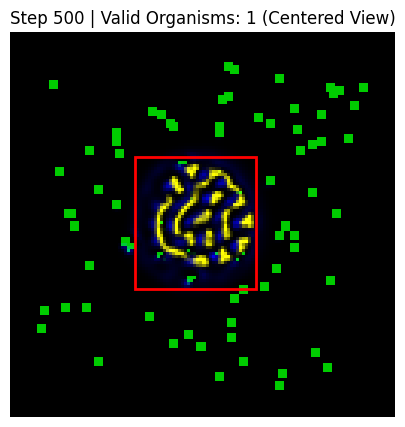

Step 600/10000 | Distinct Organisms: 1 | Best Mass: 395.8
Step 700/10000 | Distinct Organisms: 1 | Best Mass: 386.0
Step 800/10000 | Distinct Organisms: 1 | Best Mass: 395.3
Step 900/10000 | Distinct Organisms: 1 | Best Mass: 396.1
Step 1000/10000 | Distinct Organisms: 1 | Best Mass: 404.2


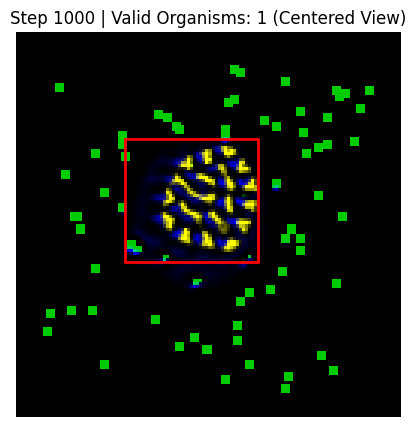

Step 1100/10000 | Distinct Organisms: 1 | Best Mass: 401.0
Step 1200/10000 | Distinct Organisms: 1 | Best Mass: 408.1
Step 1300/10000 | Distinct Organisms: 1 | Best Mass: 402.1
Step 1400/10000 | Distinct Organisms: 1 | Best Mass: 405.1
Step 1500/10000 | Distinct Organisms: 2 | Best Mass: 390.7


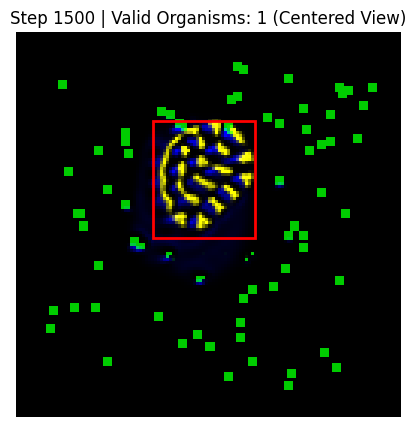

Step 1600/10000 | Distinct Organisms: 1 | Best Mass: 390.2
Step 1700/10000 | Distinct Organisms: 1 | Best Mass: 402.8
Step 1800/10000 | Distinct Organisms: 1 | Best Mass: 411.0
Step 1900/10000 | Distinct Organisms: 1 | Best Mass: 419.3
Step 2000/10000 | Distinct Organisms: 1 | Best Mass: 422.6


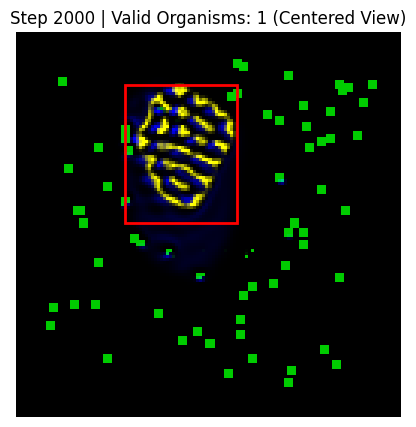

Step 2100/10000 | Distinct Organisms: 1 | Best Mass: 412.9
Step 2200/10000 | Distinct Organisms: 1 | Best Mass: 423.7
Step 2300/10000 | Distinct Organisms: 1 | Best Mass: 441.3
Step 2400/10000 | Distinct Organisms: 1 | Best Mass: 440.4
Step 2500/10000 | Distinct Organisms: 1 | Best Mass: 443.3


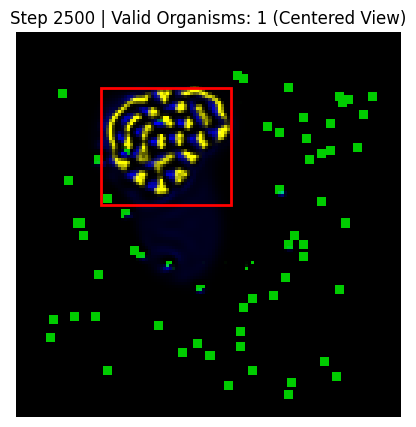

Step 2600/10000 | Distinct Organisms: 1 | Best Mass: 444.1
Step 2700/10000 | Distinct Organisms: 1 | Best Mass: 447.6
Step 2800/10000 | Distinct Organisms: 1 | Best Mass: 440.7
Step 2900/10000 | Distinct Organisms: 1 | Best Mass: 431.8
Step 3000/10000 | Distinct Organisms: 1 | Best Mass: 433.9


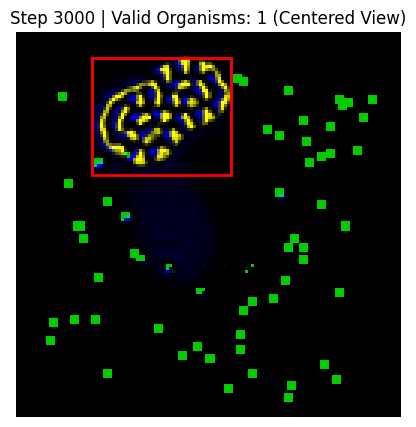

Step 3100/10000 | Distinct Organisms: 1 | Best Mass: 425.4
Step 3200/10000 | Distinct Organisms: 1 | Best Mass: 432.4
Step 3300/10000 | Distinct Organisms: 1 | Best Mass: 434.6
Step 3400/10000 | Distinct Organisms: 1 | Best Mass: 433.2
Step 3500/10000 | Distinct Organisms: 1 | Best Mass: 432.0


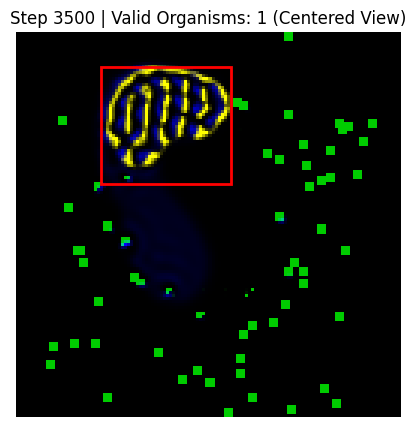

Step 3600/10000 | Distinct Organisms: 1 | Best Mass: 433.6
Step 3700/10000 | Distinct Organisms: 1 | Best Mass: 431.1
Step 3800/10000 | Distinct Organisms: 1 | Best Mass: 431.6
Step 3900/10000 | Distinct Organisms: 1 | Best Mass: 430.5
Step 4000/10000 | Distinct Organisms: 2 | Best Mass: 430.6


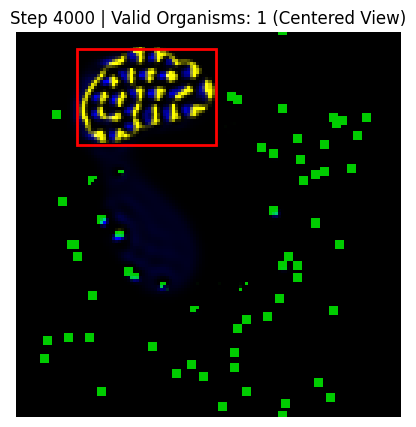

Step 4100/10000 | Distinct Organisms: 2 | Best Mass: 430.4
Step 4200/10000 | Distinct Organisms: 2 | Best Mass: 424.6
Step 4300/10000 | Distinct Organisms: 2 | Best Mass: 425.5
Step 4400/10000 | Distinct Organisms: 2 | Best Mass: 422.3
Step 4500/10000 | Distinct Organisms: 2 | Best Mass: 415.7


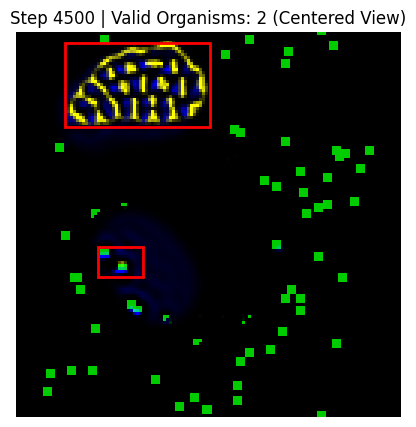

Step 4600/10000 | Distinct Organisms: 2 | Best Mass: 415.8
Step 4700/10000 | Distinct Organisms: 2 | Best Mass: 412.7
Step 4800/10000 | Distinct Organisms: 2 | Best Mass: 415.6
Step 4900/10000 | Distinct Organisms: 2 | Best Mass: 419.2
Step 5000/10000 | Distinct Organisms: 2 | Best Mass: 420.9


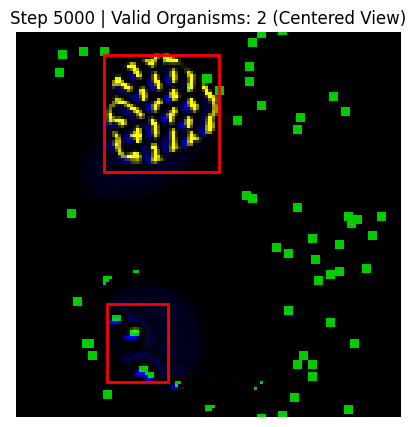

Step 5100/10000 | Distinct Organisms: 2 | Best Mass: 419.6
Step 5200/10000 | Distinct Organisms: 2 | Best Mass: 422.3
Step 5300/10000 | Distinct Organisms: 2 | Best Mass: 421.5
Step 5400/10000 | Distinct Organisms: 1 | Best Mass: 467.4
Step 5500/10000 | Distinct Organisms: 1 | Best Mass: 463.6


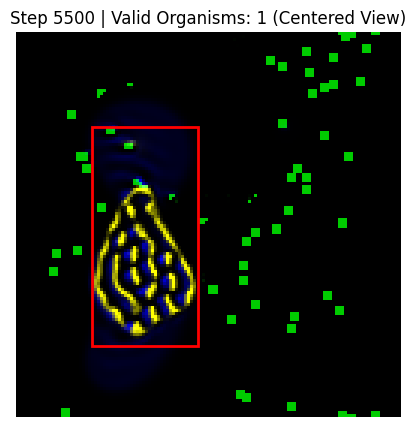

Step 5600/10000 | Distinct Organisms: 1 | Best Mass: 480.3
Step 5700/10000 | Distinct Organisms: 1 | Best Mass: 484.1
Step 5800/10000 | Distinct Organisms: 1 | Best Mass: 490.1
Step 5900/10000 | Distinct Organisms: 1 | Best Mass: 527.9
Step 6000/10000 | Distinct Organisms: 1 | Best Mass: 514.2


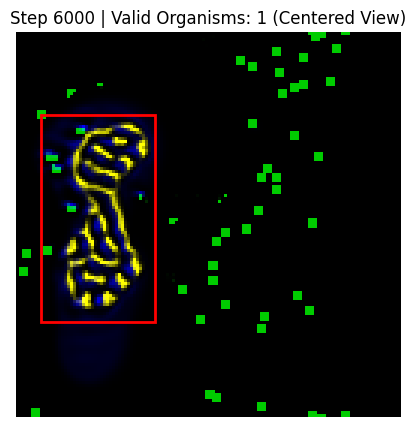

Step 6100/10000 | Distinct Organisms: 1 | Best Mass: 519.3
Step 6200/10000 | Distinct Organisms: 1 | Best Mass: 528.9
Step 6300/10000 | Distinct Organisms: 1 | Best Mass: 530.3
Step 6400/10000 | Distinct Organisms: 1 | Best Mass: 532.7
Step 6500/10000 | Distinct Organisms: 1 | Best Mass: 537.6


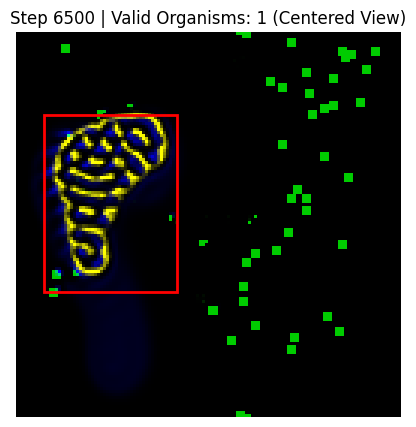

Step 6600/10000 | Distinct Organisms: 1 | Best Mass: 534.2
Step 6700/10000 | Distinct Organisms: 1 | Best Mass: 543.5
Step 6800/10000 | Distinct Organisms: 1 | Best Mass: 531.5
Step 6900/10000 | Distinct Organisms: 1 | Best Mass: 528.2
Step 7000/10000 | Distinct Organisms: 2 | Best Mass: 533.1


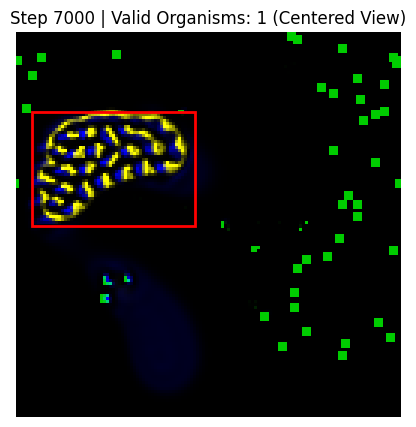

Step 7100/10000 | Distinct Organisms: 1 | Best Mass: 532.8
Step 7200/10000 | Distinct Organisms: 2 | Best Mass: 535.5
Step 7300/10000 | Distinct Organisms: 2 | Best Mass: 543.6
Step 7400/10000 | Distinct Organisms: 2 | Best Mass: 567.2
Step 7500/10000 | Distinct Organisms: 2 | Best Mass: 597.0


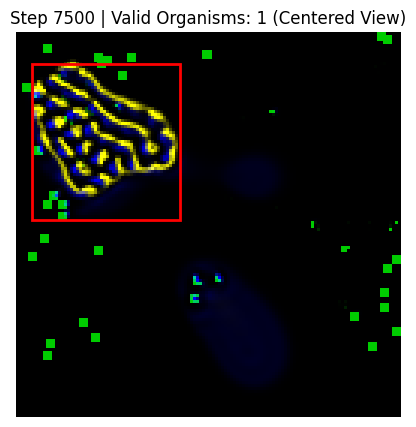

Step 7600/10000 | Distinct Organisms: 1 | Best Mass: 602.1
Step 7700/10000 | Distinct Organisms: 1 | Best Mass: 615.8
Step 7800/10000 | Distinct Organisms: 1 | Best Mass: 617.5
Step 7900/10000 | Distinct Organisms: 1 | Best Mass: 621.0
Step 8000/10000 | Distinct Organisms: 1 | Best Mass: 608.7


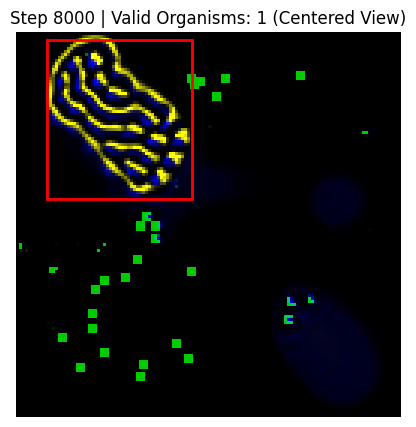

Step 8100/10000 | Distinct Organisms: 1 | Best Mass: 604.9
Step 8200/10000 | Distinct Organisms: 1 | Best Mass: 599.2
Step 8300/10000 | Distinct Organisms: 1 | Best Mass: 597.2
Step 8400/10000 | Distinct Organisms: 1 | Best Mass: 590.5
Step 8500/10000 | Distinct Organisms: 1 | Best Mass: 589.0


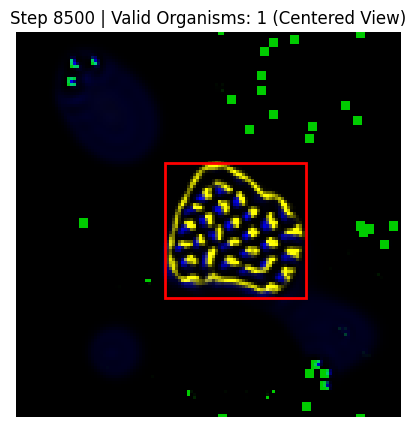

Step 8600/10000 | Distinct Organisms: 1 | Best Mass: 585.4
Step 8700/10000 | Distinct Organisms: 1 | Best Mass: 586.8
Step 8800/10000 | Distinct Organisms: 1 | Best Mass: 582.3
Step 8900/10000 | Distinct Organisms: 1 | Best Mass: 586.7
Step 9000/10000 | Distinct Organisms: 1 | Best Mass: 587.2


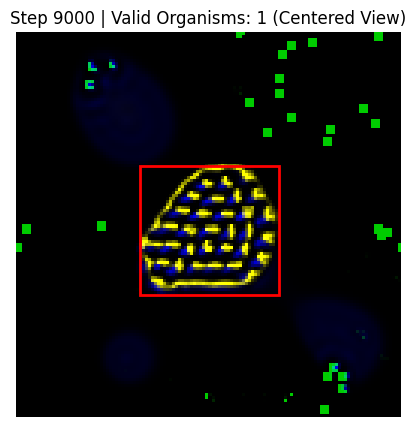

Step 9100/10000 | Distinct Organisms: 1 | Best Mass: 583.9
Step 9200/10000 | Distinct Organisms: 1 | Best Mass: 580.3
Step 9300/10000 | Distinct Organisms: 1 | Best Mass: 584.8
Step 9400/10000 | Distinct Organisms: 1 | Best Mass: 622.4
Step 9500/10000 | Distinct Organisms: 1 | Best Mass: 639.0


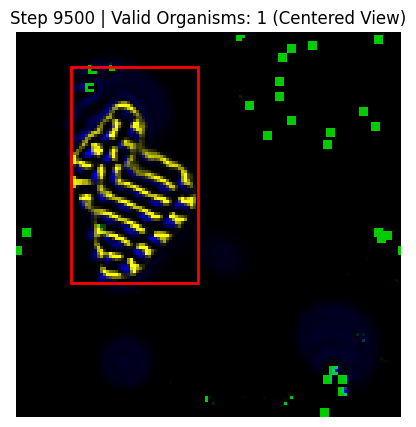

Step 9600/10000 | Distinct Organisms: 1 | Best Mass: 643.6
Step 9700/10000 | Distinct Organisms: 1 | Best Mass: 640.6
Step 9800/10000 | Distinct Organisms: 1 | Best Mass: 646.7
Step 9900/10000 | Distinct Organisms: 1 | Best Mass: 650.5
Step 10000/10000 | Distinct Organisms: 1 | Best Mass: 640.5


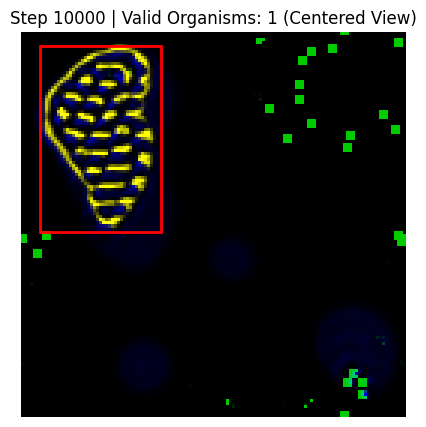

In [ ]:
from scipy.ndimage import label, center_of_mass, binary_closing, find_objects, binary_dilation
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import jax
import jax.numpy as jnp

# --- Missing Helper Functions and Classes ---
def state2img_clean_food(A, Food):
    C_img = A.shape[-1]
    A_base = np.dstack([A[..., 0], A[..., 0], A[..., 1]]) if C_img == 2 else np.repeat(A, 3, axis=-1)
    A_base[..., 1] = np.clip(A_base[..., 1] + Food[..., 0]*0.8, 0, 1) # Green Food
    return np.clip(A_base, 0, 1)

class OrganismTrackerFood:
    def __init__(self, threshold=0.2, gap_tolerance=5, min_mass=20.0):
        self.threshold = threshold
        self.gap_tolerance = gap_tolerance
        self.min_mass = min_mass
        self.structure = np.ones((3, 3), dtype=int)
        self.closing_struct = np.ones((gap_tolerance, gap_tolerance), dtype=int)

    def count_and_visualize(self, frame, food_frame, step):
        mass_map = np.sum(frame, axis=-1)
        empty_row = np.argmin(np.sum(mass_map, axis=1))
        empty_col = np.argmin(np.sum(mass_map, axis=0))
        shift_x, shift_y = -empty_row, -empty_col

        rolled_mass = np.roll(mass_map, (shift_x, shift_y), axis=(0, 1))
        rolled_frame = np.roll(frame, (shift_x, shift_y), axis=(0, 1))
        rolled_food = np.roll(food_frame, (shift_x, shift_y), axis=(0, 1))

        binary_map = rolled_mass > self.threshold
        closed_map = binary_closing(binary_map, structure=self.closing_struct) if self.gap_tolerance > 1 else binary_map
        labeled_array, num_features = label(closed_map, structure=self.structure)

        valid_boxes = []
        if num_features > 0:
            slices = find_objects(labeled_array)
            for i, slc in enumerate(slices):
                if slc is not None:
                    if np.sum(rolled_mass[slc][labeled_array[slc] == (i + 1)]) >= self.min_mass:
                        valid_boxes.append(slc)

        fig, ax = plt.subplots(figsize=(5, 5))
        ax.imshow(state2img_clean_food(rolled_frame, rolled_food))
        for slc in valid_boxes:
            y_slice, x_slice = slc
            ymin, ymax = y_slice.start, y_slice.stop
            xmin, xmax = x_slice.start, x_slice.stop
            rect = patches.Rectangle((xmin, ymin), xmax - xmin, ymax - ymin,
                                     linewidth=2, edgecolor='red', facecolor='none')
            ax.add_patch(rect)
        plt.title(f"Step {step} | Valid Organisms: {len(valid_boxes)} (Centered View)")
        plt.axis('off')
        plt.show()
        return len(valid_boxes)

# --- 4. Single-Agent Ecology Loop ---
def run_single_ecology_sim(seed, filename):
    print(f"\nInitializing Single-Agent Ecology (Seed: {seed})...")

    key = jax.random.PRNGKey(seed)
    params_seed, _ = jax.random.split(key)
    params = fl_multi.rule_space.sample(params_seed)
    c_params_multi = fl_multi.kernel_computer(params)

    # Initialize State Arrays
    A = np.zeros((SX_multi, SY_multi, C_multi))
    P = np.zeros((SX_multi, SY_multi, nb_k_multi))
    W_grid = np.zeros((SX_multi, SY_multi, 4, nb_k_multi))
    Food = np.zeros((SX_multi, SY_multi, 1))

    # Setup Initial Food Patches
    key_food = jax.random.PRNGKey(seed + 1234)
    X, Y = np.meshgrid(np.arange(SX_multi), np.arange(SY_multi), indexing='ij')
    for _ in range(80):
        key_food, subk = jax.random.split(key_food)
        fx, fy = jax.random.randint(subk, (2,), minval=10, maxval=SX_multi-10)
        Food[np.sqrt((X - fx)**2 + (Y - fy)**2) < 2] = 1.0
    Food = np.clip(Food, 0.0, 1.0)

    # Spawn ONE Organism (Slightly larger: 20x20)
    center_x, center_y = SX_multi // 2, SY_multi // 2
    key_gen = jax.random.PRNGKey(seed)
    _, Akey, Pkey = jax.random.split(key_gen, 3)

    A[center_x-10:center_x+10, center_y-10:center_y+10, :] = np.array(jax.random.uniform(Akey, (20, 20, C_multi)))
    P[center_x-10:center_x+10, center_y-10:center_y+10, :] = np.ones((20, 20, nb_k_multi)) * np.array(jax.random.uniform(Pkey, (1, 1, nb_k_multi)))
    # Independent starting brain
    W_grid[center_x-20:center_x+20, center_y-20:center_y+20, :, :] = np.random.normal(0, 0.1, (40, 40, 4, nb_k_multi))

    state = State_MultiEcology(A=jnp.array(A), P=jnp.array(P), Food=jnp.array(Food), W_grid=jnp.array(W_grid))

    T_total = 10000
    update_interval = 100

    tracker = OrganismTrackerFood(threshold=0.2, gap_tolerance=5, min_mass=20.0)

    with VideoWriter(filename, fps=60) as vid:
        for step in range(0, T_total, update_interval):
            # Run JAX Physics Block
            for _ in range(update_interval):
                state = neuro_step_ecology(state, c_params_multi, use_brain=True)
                A_frame = np.array(jax.block_until_ready(state.A))
                Food_frame = np.array(state.Food)

                # Render
                vis = np.zeros((SX_multi, SY_multi, 3))
                vis[..., 0] = A_frame[..., 0]
                vis[..., 2] = A_frame[..., 1]
                vis[..., 1] = Food_frame[..., 0] * 0.8
                vid.add(np.clip(vis, 0, 1))

            # --- Python Intervention: Tracking & Spatial Brain Tracking ---
            A_np = np.array(state.A)
            W_np = np.array(state.W_grid)
            Food_np = np.array(state.Food)

            mass_map = np.sum(A_np, axis=-1)

            # --- PBC WRAPPING FIX ---
            # To match the visual tracker perfectly, we must shift the grid
            # so organisms crossing the periodic boundaries aren't counted twice.
            empty_row = np.argmin(np.sum(mass_map, axis=1))
            empty_col = np.argmin(np.sum(mass_map, axis=0))
            shift_x, shift_y = -empty_row, -empty_col

            rolled_mass = np.roll(mass_map, (shift_x, shift_y), axis=(0, 1))
            rolled_W = np.roll(W_np, (shift_x, shift_y), axis=(0, 1))

            # Apply the same binary closing used by the tracker
            binary_map = rolled_mass > 0.2
            closing_struct = np.ones((5, 5), dtype=int)
            closed_map = binary_closing(binary_map, structure=closing_struct)

            labeled_array, num_features = label(closed_map, structure=np.ones((3,3)))

            valid_indices = []
            masses = []

            # Filter by mass >= 10.0 (lowered to allow smaller split pieces to keep their brain)
            for i in range(1, num_features + 1):
                org_mass = np.sum(rolled_mass[labeled_array == i])
                if org_mass >= 10.0:
                    valid_indices.append(i)
                    masses.append(org_mass)

            num_valid = len(valid_indices)

            if num_valid > 0:
                best_idx = valid_indices[np.argmax(masses)]
                best_W = np.mean(rolled_W[labeled_array == best_idx], axis=0)

                # Keep previous brains with a slight decay instead of zeroing completely
                # This prevents pieces from losing their brain if they step outside the mask
                new_rolled_W = rolled_W.copy() * 0.95

                for i in valid_indices:
                    mask = (labeled_array == i)
                    # Surviving: own brain + small mutation
                    org_W = np.mean(rolled_W[mask], axis=0) + np.random.normal(0, 0.02, best_W.shape)

                    # Increase dilation to 12 so the brain grid covers the organism even if it moves fast
                    dilated_mask = binary_dilation(mask, iterations=12)
                    new_rolled_W[dilated_mask] = org_W

                W_np = np.roll(new_rolled_W, (-shift_x, -shift_y), axis=(0, 1))

            state = State_MultiEcology(A=jnp.array(A_np), P=state.P, Food=jnp.array(Food_np), W_grid=jnp.array(W_np))
            print(f"Step {step+update_interval}/{T_total} | Distinct Organisms: {num_valid} | Best Mass: {np.max(masses) if num_valid > 0 else 0:.1f}")

            # Print Tracker Image every 500 steps
            if (step + update_interval) % 500 == 0:
                try:
                    tracker.count_and_visualize(A_frame, Food_frame, step + update_interval)
                except Exception as e:
                    print(f"Error displaying tracker image: {e}")

    vid.show(width=400, height=400, maxduration=10000000)

# Run the single simulation
run_single_ecology_sim(42, "single_ecology_10k.mp4")


# Multi Agent

<!-- Cleared Iteration 4 cell -->

<!-- Cleared Iteration 4 cell -->

\subsection{Towards Open-Endedness: Dynamical Ecology}

